In [ ]:
#@title Data retrieval
import os, requests

fname = "stringer_spontaneous.npy"
url = "https://osf.io/dpqaj/download"

if not os.path.isfile(fname):
  try:
    r = requests.get(url)
  except requests.ConnectionError:
    print("!!! Failed to download data !!!")
  else:
    if r.status_code != requests.codes.ok:
      print("!!! Failed to download data !!!")
    else:
      with open(fname, "wb") as fid:
        fid.write(r.content)

In [ ]:
import numpy as np
dat = np.load('stringer_spontaneous.npy', allow_pickle=True).item()
print(dat.keys())

dict_keys(['sresp', 'run', 'beh_svd_time', 'beh_svd_mask', 'stat', 'pupilArea', 'pupilCOM', 'xyz'])


In [ ]:
#verify data shapes
print('calcium transients sresp',dat['sresp'].shape)
print('runspeed', dat['run'].shape)
print('beh_svd_time', dat['beh_svd_time'].shape)
print('beh_svd_mask', dat['beh_svd_mask'].shape)
print('stat', dat['stat'].shape)
print('pupilarea', dat['pupilArea'].shape)
print('pupilCOM', dat['pupilCOM'].shape)
print('xyz', dat['xyz'].shape)

calcium transients sresp (11983, 7018)
runspeed (7018, 1)
beh_svd_time (7018, 1000)
beh_svd_mask (240, 320, 1000)
stat (11983, 1)
pupilarea (7018, 1)
pupilCOM (7018, 2)
xyz (3, 11983)


In [ ]:
#Show descriptive statistics of the behavioral variables 
from scipy.stats import describe

print('runspeed stats')
print(describe(dat['run']))
print('svd_time #0')
print(describe(dat['beh_svd_time'][:,0]))
print('svd_time #1')
print(describe(dat['beh_svd_time'][:,1]))
print('pupilArea')
print(describe(dat['pupilArea']))
print('pupilCOM x')
print(describe(dat['pupilCOM'][:,0]))
print('pupilCOM y')
print(describe(dat['pupilCOM'][:,1]))


runspeed stats
DescribeResult(nobs=7018, minmax=(array([0.]), array([57.55417351])), mean=array([3.9668141]), variance=array([79.22486334]), skewness=array([2.65906762]), kurtosis=array([6.66806113]))
svd_time #0
DescribeResult(nobs=7018, minmax=(-3326.1749674479165, 1231.5196533203125), mean=-91.58865735168365, variance=1866838.761850172, skewness=-0.656199151529192, kurtosis=-1.1435382598309765)
svd_time #1
DescribeResult(nobs=7018, minmax=(-1282.4165445963542, 793.0680948893229), mean=-0.7109471028591937, variance=91910.22712493554, skewness=-0.9257364072282451, kurtosis=1.5533651096266494)
pupilArea
DescribeResult(nobs=7018, minmax=(array([238.46559326]), array([2520.45608155])), mean=array([902.20728839]), variance=array([139186.85365271]), skewness=array([0.77009016]), kurtosis=array([0.07703335]))
pupilCOM x
DescribeResult(nobs=7018, minmax=(nan, nan), mean=nan, variance=nan, skewness=nan, kurtosis=nan)
pupilCOM y
DescribeResult(nobs=7018, minmax=(nan, nan), mean=nan, variance=n

In [ ]:
#@title Import matplotlib and set defaults
from matplotlib import rcParams 
from matplotlib import pyplot as plt
rcParams['figure.figsize'] = [24, 5]
rcParams['font.size'] = 15
rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False
rcParams['figure.autolayout'] = True


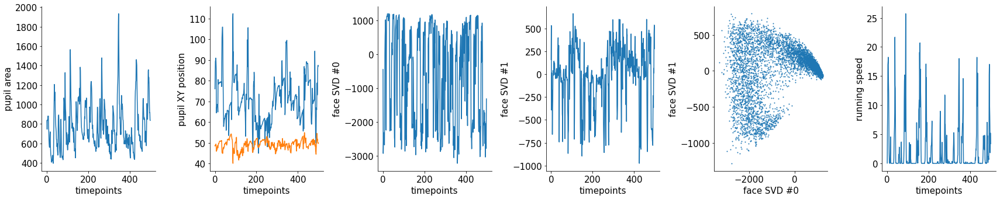

In [ ]:
#@title Basic properties of behavioral data using plot and scatter
ax = plt.subplot(1,6,1)
plt.plot(dat['pupilArea'][:500,0])
ax.set(xlabel='timepoints', ylabel = 'pupil area')

ax = plt.subplot(1,6,2)
plt.plot(dat['pupilCOM'][:500,:])
ax.set(xlabel='timepoints', ylabel = 'pupil XY position')

ax = plt.subplot(1,6,3)
plt.plot(dat['beh_svd_time'][:500,0])
ax.set(xlabel='timepoints', ylabel = 'face SVD #0')

ax = plt.subplot(1,6,4)
plt.plot(dat['beh_svd_time'][:500,1])
ax.set(xlabel='timepoints', ylabel = 'face SVD #1')

ax = plt.subplot(1,6,5)
plt.scatter(dat['beh_svd_time'][:,0], dat['beh_svd_time'][:,1], s = 1)
ax.set(xlabel='face SVD #0', ylabel = 'face SVD #1')

ax = plt.subplot(1,6,6)
plt.plot(dat['run'][:500,0])
ax.set(xlabel='timepoints', ylabel = 'running speed')

plt.show()


In [ ]:
from scipy.spatial.distance import cdist 
from scipy.stats import zscore

# z-score calcium transients 
Z = zscore(dat['sresp'], axis=1)

#verify the number of nans in pupilCOM 
print('number of nans in pupilCOM x and y')
print(np.sum(np.isnan(dat['pupilCOM'][:,0])))
print(np.sum(np.isnan(dat['pupilCOM'][:,1])))

#replace nans with interpolated values 
nan_idx = np.where(np.isnan(dat["pupilCOM"]))[0]
#print(nan_idx)

# Linear interpolation of the nans
#dat["pupilCOM"] = np.nan_to_num(dat["pupilCOM"])
for i in nan_idx: 
  dat['pupilCOM'][i] = np.nansum(dat['pupilCOM'][i-2:i+3])/4 

#verify nan`s were replaced by zeros 
print('new number of nans in pupilCOM x and y')
print(np.sum(np.isnan(dat['pupilCOM'][:,0])))
print(np.sum(np.isnan(dat['pupilCOM'][:,1])))
#corr_vals_z = {}

number of nans in pupilCOM x and y
17
17
new number of nans in pupilCOM x and y
0
0


In [ ]:
#create corr_vals dictionary and compute the correlation between each behavioral variable and the neurons 
corr_vals = {}
corr_vals["run"] = 1 - cdist(dat['run'].T, Z, metric='correlation')
corr_vals["pupilArea"] = 1 - cdist(dat['pupilArea'].T, Z, metric='correlation') 
corr_vals["pupilCOM"] = 1 - cdist(dat['pupilCOM'].T, Z, metric='correlation') 
corr_vals["beh_svd_time"] = 1 - cdist(dat['beh_svd_time'][:,:2].T, Z, metric='correlation')


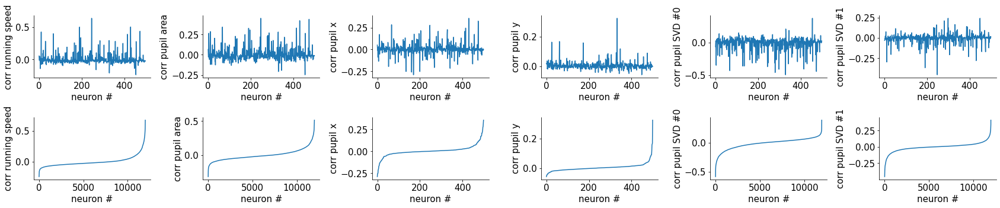

In [ ]:
#@title Basic properties of behavioral data using plot and scatter
ax = plt.subplot(2,6,1)
plt.plot(corr_vals["run"][:,:500].T)
ax.set(xlabel='neuron #', ylabel = 'corr running speed')

ax = plt.subplot(2,6,2)
plt.plot(corr_vals["pupilArea"][:,:500].T)
ax.set(xlabel='neuron #', ylabel = 'corr pupil area')

ax = plt.subplot(2,6,3)
plt.plot(corr_vals["pupilCOM"][0,:500])
ax.set(xlabel='neuron #', ylabel = 'corr pupil x')

ax = plt.subplot(2,6,4)
plt.plot(corr_vals["pupilCOM"][1,:500])
ax.set(xlabel='neuron #', ylabel = 'corr pupil y')

ax = plt.subplot(2,6,5)
plt.plot(corr_vals["beh_svd_time"][0,:500])
ax.set(xlabel='neuron #', ylabel = 'corr pupil SVD #0')

ax = plt.subplot(2,6,6)
plt.plot(corr_vals["beh_svd_time"][1,:500])
ax.set(xlabel='neuron #', ylabel = 'corr pupil SVD #1')

#ordered correlations (gives us an idea of the distribution - next we are going to plot the histograms)
ax = plt.subplot(2,6,7)
plt.plot(np.sort(corr_vals["run"]).T)
ax.set(xlabel='neuron #', ylabel = 'corr running speed')

ax = plt.subplot(2,6,8)
plt.plot(np.sort(corr_vals["pupilArea"]).T)
ax.set(xlabel='neuron #', ylabel = 'corr pupil area')

ax = plt.subplot(2,6,9)
plt.plot(np.sort(corr_vals["pupilCOM"][0,:500]))
ax.set(xlabel='neuron #', ylabel = 'corr pupil x')

ax = plt.subplot(2,6,10)
plt.plot(np.sort(corr_vals["pupilCOM"][1,:500]))
ax.set(xlabel='neuron #', ylabel = 'corr pupil y')

ax = plt.subplot(2,6,11)
plt.plot(np.sort(corr_vals["beh_svd_time"][0,:]))
ax.set(xlabel='neuron #', ylabel = 'corr pupil SVD #0')

ax = plt.subplot(2,6,12)
plt.plot(np.sort(corr_vals["beh_svd_time"][1,:]))
ax.set(xlabel='neuron #', ylabel = 'corr pupil SVD #1')

plt.show()

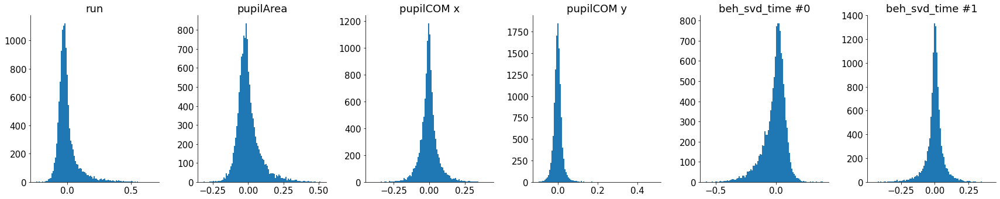

In [ ]:
ax = plt.subplot(1,6,1)
plt.hist(np.reshape(corr_vals["run"],(-1,)), bins=100)
ax.set(title='run')
ax = plt.subplot(1,6,2)
plt.hist(np.reshape(corr_vals["pupilArea"],(-1,)), bins=100)
ax.set(title='pupilArea')
ax = plt.subplot(1,6,3)
plt.hist(np.reshape(corr_vals["pupilCOM"][0,:],(-1,)), bins=100)
ax.set(title='pupilCOM x')
ax = plt.subplot(1,6,4)
plt.hist(np.reshape(corr_vals["pupilCOM"][1,:],(-1,)), bins=100)
ax.set(title='pupilCOM y')
ax = plt.subplot(1,6,5)
plt.hist(np.reshape(corr_vals["beh_svd_time"][0,:],(-1,)), bins=100)
ax.set(title='beh_svd_time #0')
ax = plt.subplot(1,6,6)
plt.hist(np.reshape(corr_vals["beh_svd_time"][1,:],(-1,)), bins=100)
ax.set(title='beh_svd_time #1')

plt.show()

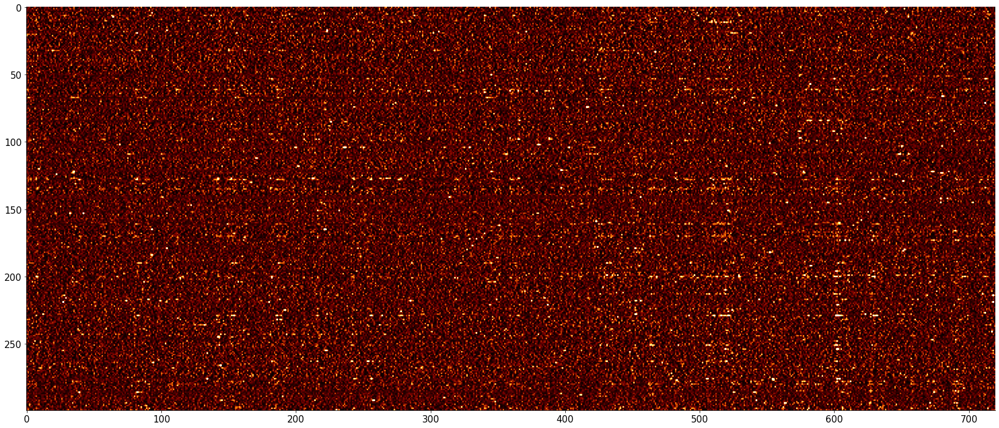

In [ ]:
#visualise first 300 neurons and first 720 seconds 
rcParams['figure.figsize'] = [30, 10]
fig = plt.imshow(Z[:300,:720],cmap='afmhot', vmin=-1, vmax=5)

In [ ]:
from scipy.cluster.hierarchy import linkage, fclusterdata
from scipy.spatial.distance import pdist, squareform
from sklearn.decomposition import PCA
from time import time 

#get shape of calcium transients matrix to limit number of PCs of PCA
nrows, ncols = Z.shape

#choose fraction of the smallest dimension to use as number of PCs
f = 0.05 

start = time()
pca = PCA(n_components=int(np.floor(ncols*f)))
pca.fit(Z.T)
print('elapsed time to run PCA: ', str(time()-start), ' seconds')


elapsed time to run PCA:  18.306690216064453  seconds


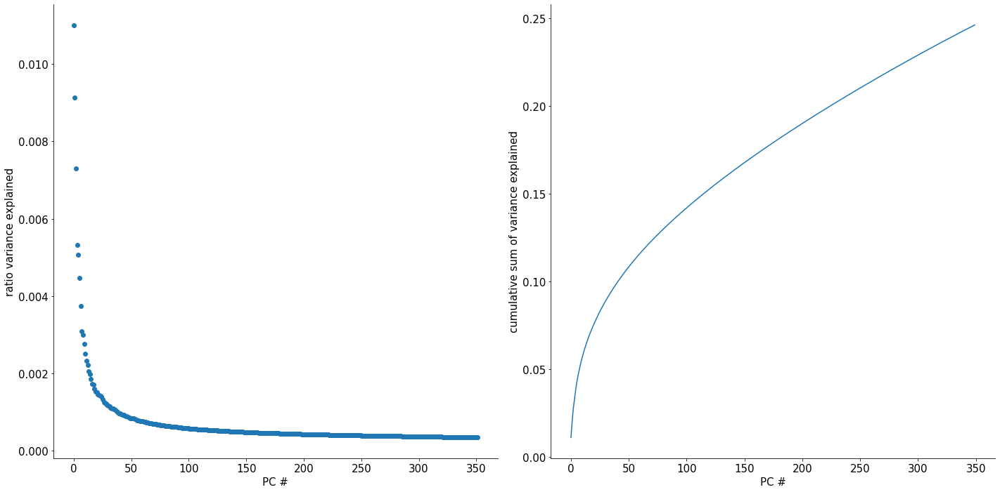

In [ ]:
#see how PCs explain variation in data
rcParams['figure.figsize'] = [20, 10]

ax = plt.subplot(1,2,1)
plt.scatter(np.linspace(0,int(np.floor(ncols*f))+1,int(np.floor(ncols*f))),pca.explained_variance_ratio_)
ax.set(xlabel='PC #', ylabel = 'ratio variance explained')
ax = plt.subplot(1,2,2)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
ax.set(xlabel='PC #', ylabel = 'cumulative sum of variance explained')

plt.show()

(350, 11983)


/usr/local/lib/python3.6/dist-packages/matplotlib/collections.py:885: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


[Text(0.5, 0, 'PC #2'), Text(0.5, 0, 'PC #1'), Text(0.5, 0, 'PC #0')]

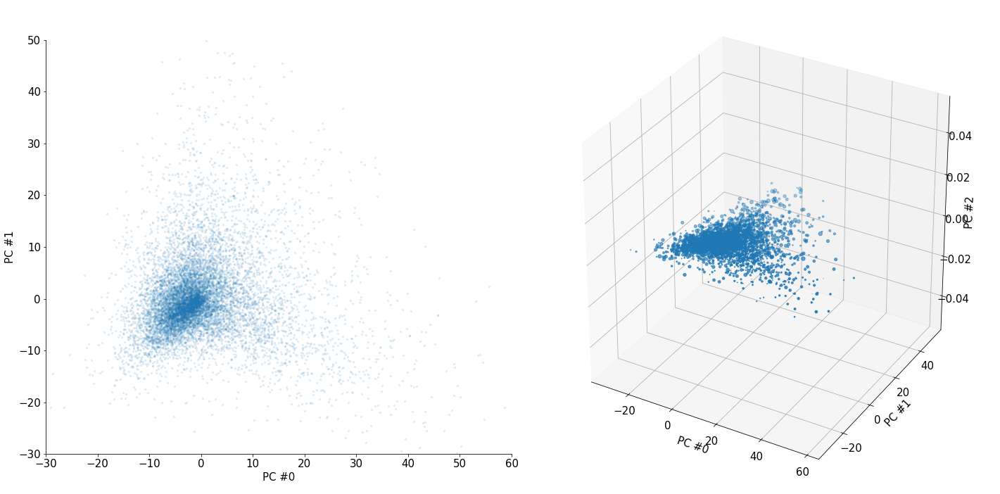

In [ ]:
from mpl_toolkits.mplot3d import Axes3D

evectors = pca.components_
print(evectors.shape)

Z_transformed = pca.fit_transform(Z)

ax = plt.subplot(121)
plt.scatter(Z_transformed[:,0],Z_transformed[:,1],s=5,alpha=.1)
ax.set(xlabel='PC #0', ylabel = 'PC #1')
ax.set_aspect('equal')
plt.xlim((-30,60))
plt.ylim((-30,50))
ax = plt.subplot(122, projection='3d')
plt.scatter(Z_transformed[:,0],Z_transformed[:,1],Z_transformed[:,2])
ax.set(xlabel='PC #0', ylabel = 'PC #1', zlabel='PC #2')


***WARNING!!!*** DON'T RUN THE CELL BELOW IF YOU DO NOT WANT TO WAIT A LONG TIME....

In [ ]:
from sklearn.manifold import TSNE

embed = {}
start = time()

for i,perp in enumerate([3,10,30],1): 
  #instantiate and run t-SNE 
  tsne_model = TSNE(n_components=2,perplexity=perp, random_state=2020)
  embed[perp] = tsne_model.fit_transform(Z_transformed[:,:100]) #we used 100 PCs, you may lower temporarily to make it a little faster

  ax = plt.subplot(1,3,i)
  plt.scatter(embed[perp][:,0],embed[perp][:,1])
  ax.set(title='perplexity: '+str(perp), xlabel='t-SNE #1', ylabel='t-SNE #2')

print('elapsed time to run t-SNE: ', str(time()-start), ' seconds')


## Supervised clustering of calcium transients




In [ ]:
import copy
#reorganize the dataset in order to perform the clustering and correlation measures iteratively
beh_data = {}

#beh_data will be used 
beh_data['run'] = copy.copy(dat['run'])
beh_data['beh_svd_time0'] = copy.copy(dat['beh_svd_time'][:,0])
beh_data['beh_svd_time1'] = copy.copy(dat['beh_svd_time'][:,1])
beh_data['pupilArea'] = copy.copy(dat['pupilArea'])
beh_data['pupilCOM_x'] = copy.copy(dat['pupilCOM'][:,0])
beh_data['pupilCOM_y'] = copy.copy(dat['pupilCOM'][:,1])

# ravel the data
beh_data = {key : np.ravel(value) for key, value in beh_data.items()}

In [ ]:
import scipy.signal as sc

print('remind ourselves of the shape of calcium transient data: ', dat['sresp'].shape)
#get the nrows and ncols again but now from dat['sresp']
nrows, ncols = dat['sresp'].shape

# in case you`d like to run the analysis that follows with fewer neurons, set in number_neurons
number_neurons = nrows
#number_neurons = 1000

# neuron_data are now calcium transient data, z-scored
neuron_data = dat['sresp'][0:number_neurons,:]
neuron_data = zscore(neuron_data, axis=1)

# build auxiliary dictionary to store all auxiliary data and results of clustering
clust_aux = {}
clust_aux['threshold'] = { key : 0.0 for key, _ in beh_data.items()} # threshold value for behavioral data (to filter time points of calcium transients)
clust_aux['mask'] = { key : np.zeros((ncols,)) for key, _ in beh_data.items()} #masks to filter time points
clust_aux['run_idx'] = {} #items are beh_data.keys(), values are indices of the peaks (size = number of time points)
clust_aux['temp'] = {}  #items are beh_data.keys(), 
clust_aux['pdist'] = {} #result of pairwise distances , values are cityclock distances between neurons (size = number_neurons^2)
clust_aux['cluster_idx'] = {} # items are beh_data.keys(), cluster ID the neurons belong to (size = n_neurons)
clust_aux['sorted_idx'] = {} #items are beh_data.keys(), the the index of neurons in the order sorted by cluster number (size = n_neurons)
clust_aux['mean'] = {} # items are beh_data.keys(), values are dictionaries with keys bein cluster numbers, whose values with mean calcium transient of the cluster (size = number of clusters)
clust_aux['pearson'] = {} # items are beh_data.keys(), values are dictionaries with keys being cluster numbers, whose values are pearson correlation and p values ([pearson, p-val]) 
clust_aux['neurons_in_clust'] = {}

remind ourselves of the shape of calcium transient data:  (11983, 7018)


{'run': 2.243193112797353, 'beh_svd_time0': 1087.4331855735677, 'beh_svd_time1': 296.434510084311, 'pupilArea': 130.18591947236843, 'pupilCOM_x': 11.795309048016843, 'pupilCOM_y': 5.146430462630756}


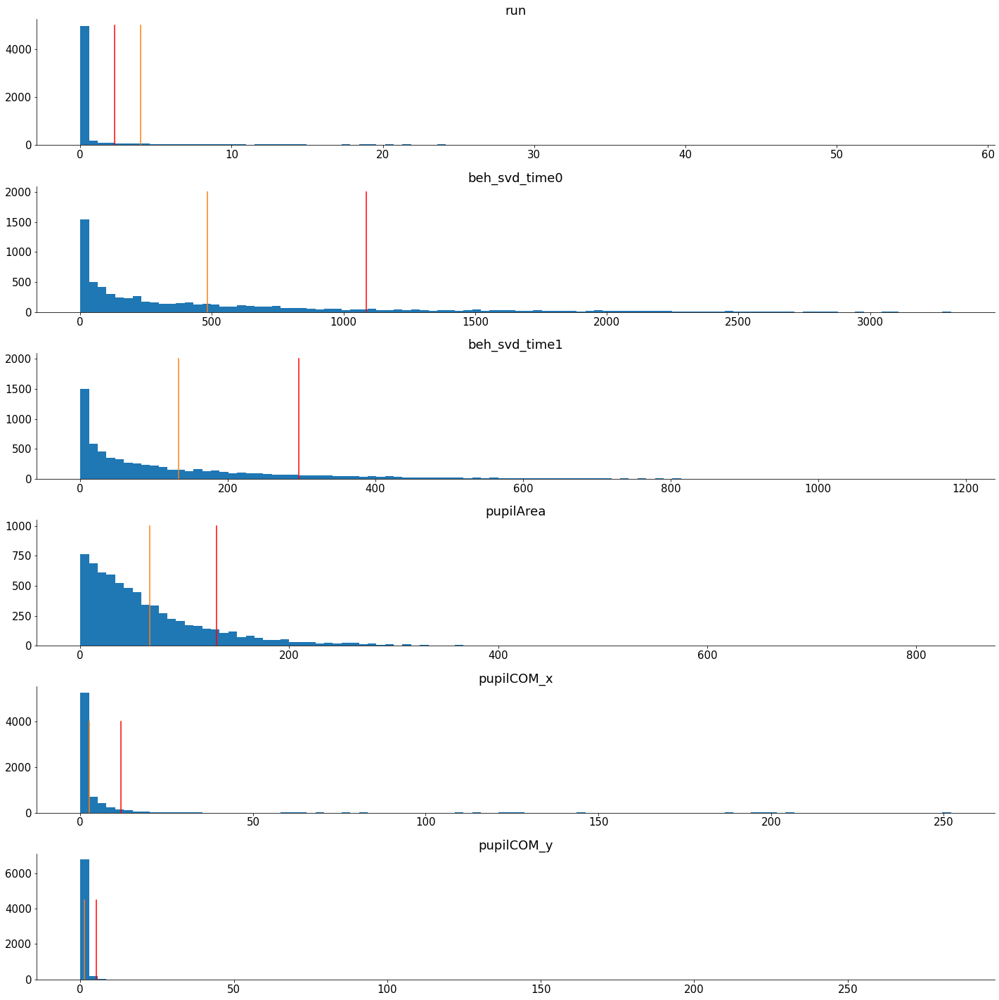

In [ ]:
# set thresholds 
rcParams['figure.figsize'] = [20, 20]
data_diff = {}
count = 1
y = [0,5000,2000,2000,1000,4000,4500]
for key, value in beh_data.items():
  if key != 'run' and key != 'pupilCOM_y': 
    data_diff[key] = np.absolute(np.diff(value,prepend=0))
    
    ax = plt.subplot(len(beh_data.keys()),1,count)
    plt.hist(data_diff[key],bins=100)
    plt.plot([np.mean(data_diff[key]), np.mean(data_diff[key])], [0,y[count]])
    plt.plot([np.mean(data_diff[key])+np.std(data_diff[key]), np.mean(data_diff[key])+np.std(data_diff[key])], [0,y[count]], c='red')
    ax.set(title=str(key))
    # print(data_diff[key].shape)
    # print('diff vector: ')
    # print(data_diff[key])
    # print('mean of the diff vector: ', str(np.mean(data_diff[key])), 'std: ', str(np.std(data_diff[key])))
    clust_aux['threshold'][key] = np.mean(data_diff[key]) + np.std(data_diff[key])
  else: 
    if key == 'run':
      ax = plt.subplot(len(beh_data.keys()),1,count)
      plt.hist(value,bins=100)
      plt.plot([np.mean(value), np.mean(value)], [0,y[count]])
      plt.plot([np.median(value) + np.std(value)/4, np.median(value) + np.std(value)/4], [0,y[count]], c='red')
      ax.set(title=str(key))
      clust_aux['threshold'][key] = np.median(value) + np.std(value)/4
    elif key == 'pupilCOM_y':
      data_diff[key] = np.absolute(np.diff(value,prepend=0)) 
      ax = plt.subplot(len(beh_data.keys()),1,count)
      plt.hist(data_diff[key],bins=100)
      plt.plot([np.mean(data_diff[key]), np.mean(data_diff[key])], [0,y[count]])
      plt.plot([np.median(data_diff[key]) + np.std(data_diff[key])/2, np.median(data_diff[key]) + np.std(data_diff[key])/2], [0,y[count]], c='red')
      ax.set(title=str(key))
      clust_aux['threshold'][key] = np.median(data_diff[key]) + np.std(value)/2
  count += 1
#threshols set
print(clust_aux['threshold'])

In [ ]:
for key, value in beh_data.items():
  if key != 'run':
    run_idx, temp = sc.find_peaks(data_diff[key], height = clust_aux['threshold'][key],  distance=7)
    clust_aux['run_idx'][key] = run_idx
    clust_aux['temp'][key] = temp
  else:
    run_idx, temp = sc.find_peaks(value, height = clust_aux['threshold'][key],  distance=7)
    clust_aux['run_idx'][key] = run_idx
    clust_aux['temp'][key] = temp


timepoints used for  run 3651.0

timepoints used for  beh_svd_time0 5600.0

timepoints used for  beh_svd_time1 4940.0

timepoints used for  pupilArea 5572.0

timepoints used for  pupilCOM_x 2609.0

timepoints used for  pupilCOM_y 463.0


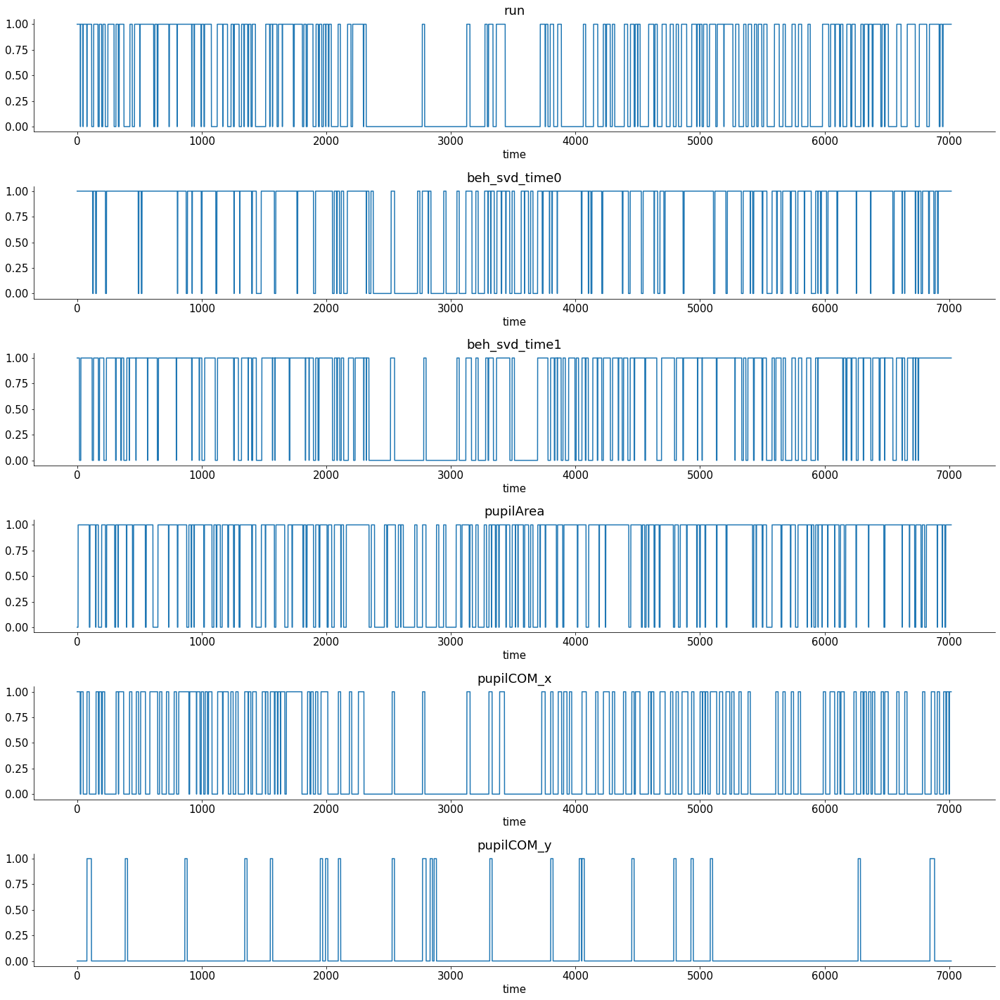

In [ ]:
# create the time point masks
#choose time window to use (+- the peak positions), in timepoints (1s)
time_wind = 10

count=1

for key, value in beh_data.items():
  lower = clust_aux['run_idx'][key] - time_wind
  upper = clust_aux['run_idx'][key] + time_wind

  print( )
  for i in range(len(clust_aux['mask'][key])):
    if np.logical_and(lower < i, upper > i).any():
      clust_aux['mask'][key][i] = 1

  ax = plt.subplot(len(beh_data.keys()),1,count)
  plt.plot(clust_aux['mask'][key]) 
  ax.set(title=str(key), xlabel='time')
  
  count += 1
  print('timepoints used for ', str(key), str(np.sum(clust_aux['mask'][key])))


### Run k-means clustering for 6 different series of calcium transients (Takes approx. 30 mins)

In [ ]:
import scipy
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

#choose the number of clusters to use as input to k-means 
number_clusters = 50

start = time()

for key, value in beh_data.items():
  start_in = time()
  # filter the neuron_data based on the mask for each behavioral variable
  filt_neuron_data = neuron_data[:,clust_aux['mask'][key].astype('bool')]
  distance_vector = scipy.spatial.distance.pdist(filt_neuron_data, metric = 'cityblock') # improves clustering if we are care about the magnitude of the spikes
  clust_aux['pdist'][key] = distance_vector

  #run the clustering method
  clus = linkage(distance_vector, method = 'ward') # variance minimization algorithm
  cluster_idx = fcluster(clus,number_clusters,'maxclust') #cluster index
  clust_aux['cluster_idx'][key] = cluster_idx

  # for clust in range(number_clusters): 
  #   print(len(cluster_idx[np.where(cluster_idx==clust+1)]))
  print('elapsed time to run k-means for '+ str(key) +': ', str(time()-start_in), ' seconds')
print('elapsed time to run all k-means: ', str(time()-start), ' seconds')

In [ ]:
for key, value in beh_data.items():
  zipped = zip(clust_aux['cluster_idx'][key],list(range(number_neurons)))
  sorted_idx = [x for _,x in sorted(zipped)]
  clust_aux['sorted_idx'][key] = np.array(sorted_idx)
  

KeyError: ignored

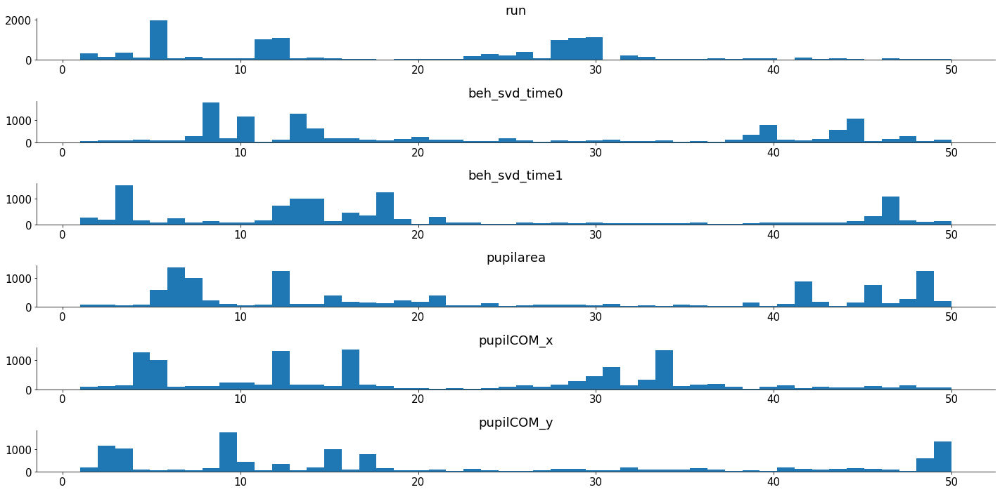

In [ ]:
count = 1
for key, value in beh_data.items():
  ax = plt.subplot(len(beh_data.keys()),1,count)
  plt.hist(clust_aux['cluster_idx'][key], bins=number_clusters) 
  ax.set(title=str(key))
  count += 1

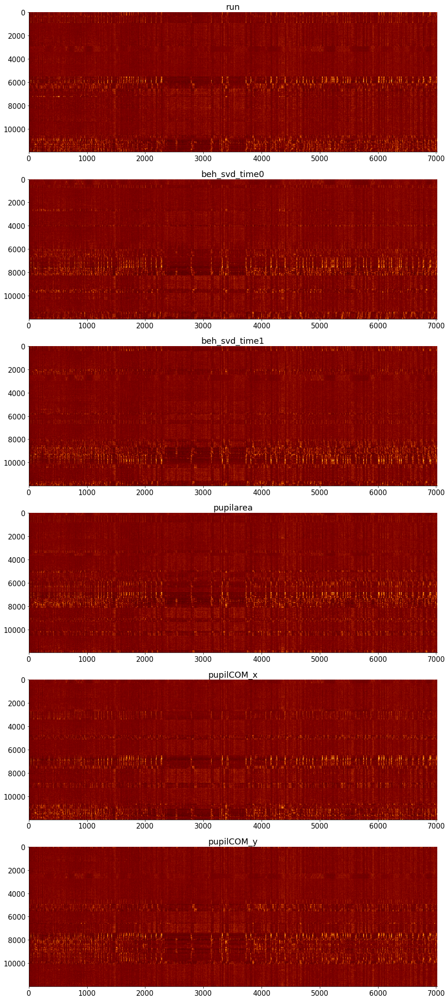

In [ ]:
rcParams['figure.figsize'] = [30, 30] 
count = 1
for key, value in beh_data.items():
  ax = plt.subplot(len(beh_data.keys()),1,count)
  plt.imshow(neuron_data[clust_aux['sorted_idx'][key],:],  aspect=0.2, vmin=-1, vmax=3, cmap='afmhot')
  ax.set(title=str(key))
  count += 1


In [ ]:
#calculate mean of each cluster
for key, value in beh_data.items():
  clust_aux['mean'][key] = {}
  clust_aux['neurons_in_clust'][key] = {}
  for clust in range(number_clusters):
    if np.sum(clust_aux['cluster_idx'][key] == (clust+1)) > 50:
      clust_aux['neurons_in_clust'][key].update({(clust+1) : np.sum(clust_aux['cluster_idx'][key]==(clust+1))})
      clust_aux['mean'][key].update({(clust+1)  : np.mean(neuron_data[np.where(clust_aux['cluster_idx'][key]==(clust+1))], axis=0)})
    else:
      continue

#use pearsons r to correlate time series
import scipy.stats

for key, value in beh_data.items():
  clust_aux['pearson'][key] = {}
  for clust in clust_aux['mean'][key].keys(): 
      a,b = scipy.stats.pearsonr(clust_aux['mean'][key][clust], value)
      clust_aux['pearson'][key].update({clust : [a, b]})
   

KeyError: ignored

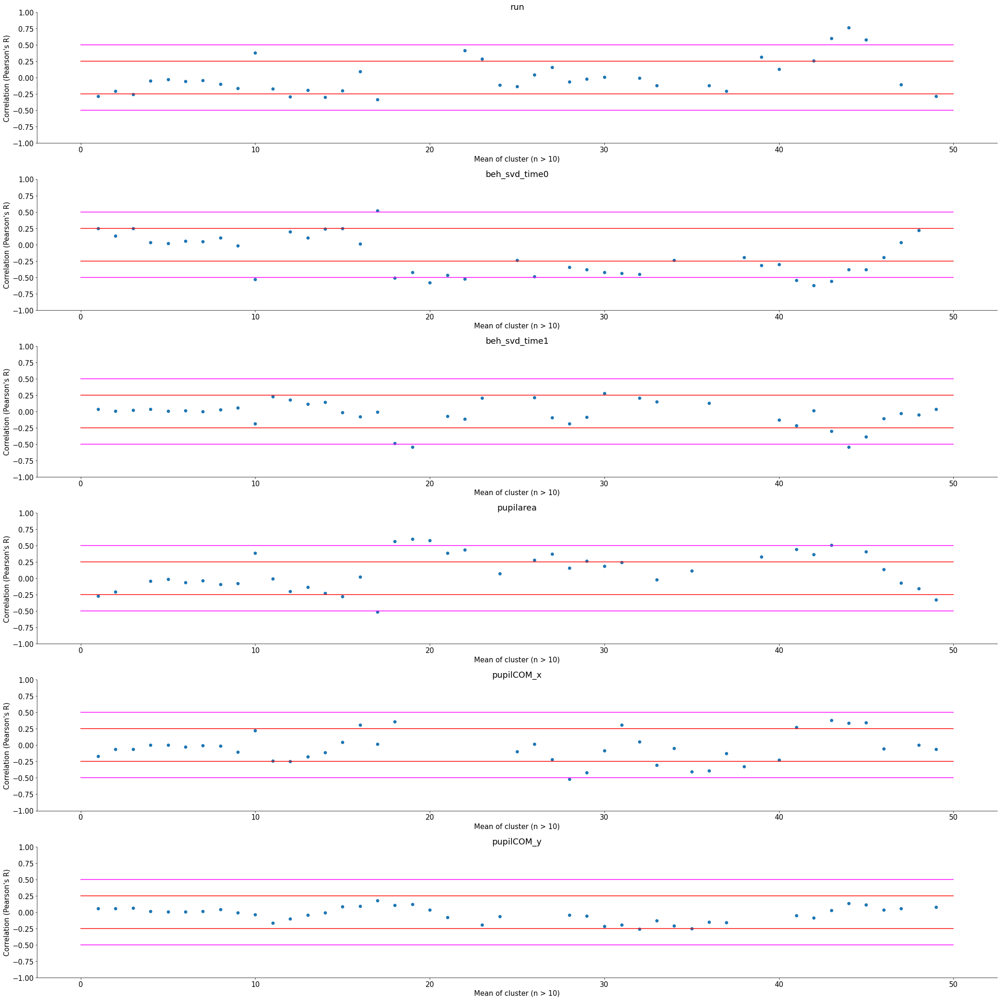

In [ ]:
count = 1
for key, value in beh_data.items():
  #plot correlation with mean of cluster
  ax = plt.subplot(len(beh_data.keys()),1,count)
  ax.set(ylim=(-1,1), ylabel="Correlation (Pearson\'s R)", xlabel="Mean of cluster (n > 50)", title=str(key))
  pearson_vals = np.array(list(clust_aux['pearson'][key].values()))
  sizes = np.array(list(clust_aux['neurons_in_clust'][key].values()))  
  plt.scatter(clust_aux['pearson'][key].keys(), pearson_vals[:,0], s=(sizes/2))
  plt.plot([0,50],[-0.25,-0.25], c='red')
  plt.plot([0,50],[0.25,0.25], c='red')
  plt.plot([0,50],[-0.5,-0.5], c='magenta')
  plt.plot([0,50],[0.5,0.5], c='magenta')
  count += 1

## Save clust_aux or other individual values in clust_aux

In [ ]:
from scipy import io as sio

#save clust_aux with scipy.io
#sio.savemat('clust_aux.mat', clust_aux)
np.save("clust_idx.npy", clust_aux['cluster_idx'])
np.save("sorted_idx.npy", clust_aux['sorted_idx'])
np.save("neurons_in_clust.npy", clust_aux['neurons_in_clust'])

# in order to reduce the size of clust aux considerably, delete ['pdist'] from it
#del clust_aux['pdist']

np.save("clust_aux.npy", clust_aux)

#clust_aux = sio.loadmat('clust_aux.mat', clust_aux)

KeyError: ignored

In [ ]:
print('check keys of corr_vals')
print(list(corr_vals.keys()))
corr_vals.update({'pupilCOM_x' : corr_vals['pupilCOM'][0,:]})
corr_vals.update({'pupilCOM_y' : corr_vals['pupilCOM'][1,:]})
corr_vals.update({'beh_svd_time0' : corr_vals['beh_svd_time'][1,:]})
corr_vals.update({'beh_svd_time1' : corr_vals['beh_svd_time'][1,:]})

del corr_vals['pupilCOM']
del corr_vals['beh_svd_time']

print('check if keys were edited correctly')
print(list(corr_vals.keys()))

check keys of corr_vals
['run', 'pupilArea', 'pupilCOM', 'beh_svd_time']
check if keys were edited correctly
['run', 'pupilArea', 'pupilCOM_x', 'pupilCOM_y', 'beh_svd_time0', 'beh_svd_time1']


In [ ]:
rcParams['figure.figsize'] = [10, 10] 
num_big_clusters = {}
big_clusters = {}
for key, corr_val in corr_vals.items():
  temp = np.ravel(corr_vals[key])
  big_clusters[key] = []
  num_big_clusters[key] = []
  for cluster, pearson_vals  in clust_aux['pearson'][key].items():
    if np.abs(pearson_vals[0]) > 0.5:
      big_clusters[key].append(cluster)
      print('cluster', str(cluster), 'in', str(key), 'has absolute pearson correlation higher than 0.5', str(pearson_vals[0]) )
      mask = clust_aux['cluster_idx'][key] == int(cluster)
      print(np.sum(mask))
      num_big_clusters[key].append(np.sum(mask))
      print('cluster '+str(cluster)+' in '+str(key))

cluster 1 in run has absolute pearson correlation higher than 0.5 0.765836457064778
332
cluster 1 in run
cluster 13 in run has absolute pearson correlation higher than 0.5 0.811015943259699
66
cluster 13 in run
cluster 14 in run has absolute pearson correlation higher than 0.5 0.731808288993994
104
cluster 14 in run
cluster 15 in run has absolute pearson correlation higher than 0.5 0.56833304501642
76
cluster 15 in run
cluster 16 in run has absolute pearson correlation higher than 0.5 0.7735404786564941
61
cluster 16 in run
cluster 22 in run has absolute pearson correlation higher than 0.5 0.536015466432736
55
cluster 22 in run
cluster 18 in pupilArea has absolute pearson correlation higher than 0.5 0.5061199599785421
118
cluster 18 in pupilArea
cluster 19 in pupilArea has absolute pearson correlation higher than 0.5 0.5334358311113382
224
cluster 19 in pupilArea
cluster 22 in pupilArea has absolute pearson correlation higher than 0.5 0.6006717574564306
66
cluster 22 in pupilArea
clust

In [ ]:
big_clusters

{'beh_svd_time0': [7, 15, 20, 25, 28, 30, 31],
 'beh_svd_time1': [2, 42, 43],
 'pupilArea': [18, 19, 22, 24],
 'pupilCOM_x': [],
 'pupilCOM_y': [],
 'run': [1, 13, 14, 15, 16, 22]}

### Decoding using SVM-R

In [ ]:
clust_aux = np.load('clust_aux.npy', allow_pickle=True).item()

In [ ]:
#this cell extracts the neuronal data for each big (n>50) and highly correlated(r>|0.5|) cluster
decoding_data = {}
for behaviour in clust_aux['cluster_idx']: 
  print(behaviour)
  decoding_data[behaviour] = {}
  for i in range(len(big_clusters[behaviour])): 
    print(big_clusters[behaviour][i])
    decoding_data[behaviour][i] = {}
    decoding_data[behaviour][i] = neuron_data[np.where(clust_aux['cluster_idx'][behaviour]==big_clusters[behaviour][i])]

run
1
13
14
15
16
22
beh_svd_time0
7
15
20
25
28
30
31
beh_svd_time1
2
42
43
pupilArea
18
19
22
24
pupilCOM_x
pupilCOM_y


In [ ]:
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

In [ ]:
import numpy as np
a = np.load('svmrRUN_actual(1).npy', allow_pickle=True)
b = np.load('svmrRUN_shuffled(1).npy', allow_pickle=True)
reload_actual = a.item()
reload_shuffle = b.item()

##### DO NOT RUN THIS CELL... 

In [ ]:
#dictionary of actual performances for each cluster 
actual_performance = dict()
#number of shuffles to compare with actual performance
num_shuffles = 100
#dictory of shuffled performances for each cluster
#should be equal to np.shape(len(actual_performances, len(num_shuffles)))
shuffled_scores = dict()

#for the most correlated cluster in each group:
for behaviour in decoding_data:
  print(behaviour)
  actual_performance[behaviour] = dict()
  shuffled_scores[behaviour] = dict()

  for clust in range(len(big_clusters[behaviour])): 
    print(clust)
    actual_performance[behaviour][clust] = dict()
    shuffled_scores[behaviour][clust] = dict()

    #create model
    # kernel (specifies the kernel type to be used in the algorithm) = default ('rbf')
    svr_model = SVR()

    #load data
    SVR_data = decoding_data[behaviour][clust]
    behaviour_data = beh_data[behaviour]
    #create empty list to append shuffled performances
    shuffled_scores[behaviour][clust] = []

    #predict actual score
    #using neuronal data at different times to predict running position
    # x_train = 1000 neurons at 4000 time points, x_test = 1000 at other 3000 time points
    # y_train = running speed at 4000 time points, y_test = running speed at 3000 time points
    # split arrays or matrices into random train and test subsets
    X_train, X_test, y_train, y_test = train_test_split(SVR_data.T, behaviour_data, test_size=0.33, random_state=42) 

    #standardized data for training: standardizes a feature by subtracting the mean and then scaling to unit variance
    #StandardScaler makes the mean of the distribution 0. About 68% of the values will lie be between -1 and 1.
    scaled = StandardScaler()
    scaled_xtrain = scaled.fit_transform(X_train)
    scaled_ytrain = scaled.fit_transform(np.reshape(y_train, (-1,1)))

    #fit model
    svr_model.fit(scaled_xtrain, np.ravel(scaled_ytrain))

    #scale test data
    scaled_xtest = scaled.fit_transform(X_test)
    scaled_ytest = scaled.fit_transform(np.reshape(y_test, (-1,1)))

    #predict test_values
    #perform regression on samples in X.
    y_pred = svr_model.predict(scaled_xtest)

    #score
    #Return the coefficient of determination R^2 of the prediction.
    #The coefficient R^2 is defined as (1 - u/v), where u is the residual sum of squares ((y_true - y_pred) ** 2).sum()
    # and v is the total sum of squares ((y_true - y_true.mean()) ** 2).sum(). 
    #The best possible score is 1.0 and it can be negative (because the model can be arbitrarily worse).
    actual_performance[behaviour][clust] = (svr_model.score(scaled_xtest, scaled_ytest))
    print("actual performance" + str(actual_performance[behaviour][clust]))

    del svr_model

    #shuffle 100 times to compare performance of model with chance
    for shuffle in range(num_shuffles):
      
      #create model
      # kernel (specifies the kernel type to be used in the algorithm) = default ('rbf')
      svr_model = SVR()
      
      #define train/test as above
      # for each iteration, use new test/train data from same data set 
      X_train, X_test, y_train, y_test = train_test_split(SVR_data.T, behaviour_data, test_size=0.33, random_state=42) 

      #shuffle Y_train
      shuf_y_train = np.copy(y_train)
      np.random.shuffle(shuf_y_train)
      
      #scale as above
      scaled = StandardScaler()
      scaled_xtrain = scaled.fit_transform(X_train)
      scaled_ytrain = scaled.fit_transform(np.reshape(shuf_y_train, (-1,1)))

      #fit as above
      svr_model.fit(scaled_xtrain, np.ravel(scaled_ytrain))

      #scale test/train
      scaled_xtest = scaled.fit_transform(X_test)
      scaled_ytest = scaled.fit_transform(np.reshape(y_test, (-1,1)))

      #predict actual y values using shuffled model
      y_pred = svr_model.predict(scaled_xtest)

      #look at accuracy
      score = svr_model.score(scaled_xtest, scaled_ytest)
      shuffled_scores[behaviour][clust].append(score)
      print(shuffle, score) 
      
      del svr_model
      
      #np.shape(scaled_ytest) = np.shape(y_pred)
      # plt.figure(figsize=(8,5))
      # plt.xlabel("Y test data")
      # plt.ylabel("SVR predicted Y")
      # plt.scatter(scaled_ytest, y_pred)

run
0
actual performance0.6441048527995952
0 -0.0016896642329524703
1 0.008823372392758988
2 -0.0021726036073057564
3 0.011566644083085165
4 0.0076270570018232
5 0.0059980290727074115
6 -0.010532184765156716
7 -0.01781202579868424
8 -0.02213186197520911
9 -0.0005667504028670223
10 -0.009939992956731869
11 0.00536511166174225
12 0.019226061738605638
13 0.012430318379162197
14 -0.002286706092267554
15 -0.0031366348495907026
16 -0.0032614200751288625
17 -0.00798183743415981
18 -0.013529353290677504
19 -0.01501817517279913
20 -0.01057995424733793
21 -0.010973207132606078
22 -0.008519694516453402
23 -0.003759468059868265
24 0.004101017901594117
25 -0.011123876533194688
26 -0.004592913117263064
27 -0.011638894976433445
28 0.01735932093170156
29 -0.020333006703775247
30 -0.0017259713402002497
31 -0.009343296413485191
32 0.010996951751456985
33 -0.006725201480914489
34 -0.012680356431594486
35 -0.008593029448865197
36 0.008156998860326281
37 -0.004564627252338527
38 0.0004318959821549839
39 0.

In [ ]:
np.save("svmrRUN_actual.npy", actual_performance)
np.save("svmrRUN_shuffled.npy", shuffled_scores)

In [ ]:
import matplotlib.pyplot as plt

#plt single figure 
import random
number_of_colors = 20
color_idx = ['k', 'm', 'b', 'g', 'r']
print(color_idx)

#leandros glm
values_dict = {
    'run': [0.726469096590281],
    'beh_svd_time0': [0.6593863342270384],
    'beh_svd_time1': [2], #ignore this
    'pupilArea': [0.5896092565116235]
}

['k', 'm', 'b', 'g', 'r']


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """


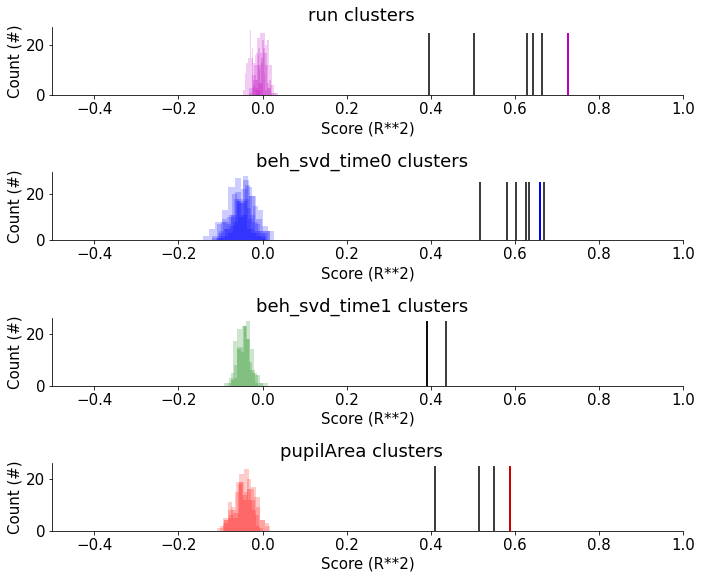

In [ ]:
counter = 1
b = plt.figure(figsize = (10,40))
for behaviour in reload_actual:
  for clust in reload_actual[behaviour]:
    ax = plt.subplot(20, 1, counter)
    ax.set(title = str(behaviour) + " clusters  ", xlabel = "Score (R**2)", ylabel = "Count (#)")
    plt.xlim(-0.5,1)
    plt.hist(reload_shuffle[behaviour][clust], label="Shuffled performance distribution", color = color_idx[counter], alpha = 0.2)
    plt.vlines(x = reload_actual[behaviour][clust], ymin=0, ymax = 25, label="Actual performance")
    plt.vlines(x = values_dict[behaviour], ymin=0, ymax = 25, label="Actual performance", color = color_idx[counter])
    # plt.legend(loc = 'upper right')
  counter += 1  
# plt.savefig('final run single hists.pdf', dpi = 200, transparent = True)

## Intrinsic and Effective dimensionality

In [ ]:
# Intrinsic dimensionality 

# 1. take PCA
from scipy.stats import zscore
from sklearn.decomposition import PCA
Z = zscore(dat['sresp'], axis=1)
Z = np.nan_to_num(Z)
pca = PCA()
pca.fit_transform(Z)  # reducing dimensionality in neurons (but decomposition of 11983 x 7018 size matrix can return the 7018 eigenvectors at max. (cause rank of the matrix is same or lower than min(rank(column), rank(row)))

array([[ 6.57024908e+00, -2.89572763e+00,  3.54286957e+00, ...,
         2.10926026e-01,  3.96061242e-02,  1.79512244e-05],
       [-3.28516483e+00, -3.36009693e+00, -2.57338095e+00, ...,
         3.68239135e-02,  9.45934467e-03,  1.95773391e-05],
       [-2.41930652e+00, -7.94693649e-01, -1.91243160e+00, ...,
        -2.89699793e-01, -2.66291909e-02,  1.62653469e-05],
       ...,
       [-4.23804045e+00, -1.50375009e+00, -6.67284918e+00, ...,
        -2.76951462e-01, -1.20329775e-01,  3.86256470e-05],
       [-3.02133369e+00,  2.89364767e+00, -1.91268399e-01, ...,
        -9.65573883e-04, -2.43790634e-02, -1.01460155e-05],
       [-2.30657554e+00, -1.13118851e+00, -3.68098807e+00, ...,
        -1.69136390e-01,  1.51807874e-01,  4.13907655e-05]], dtype=float32)

4954


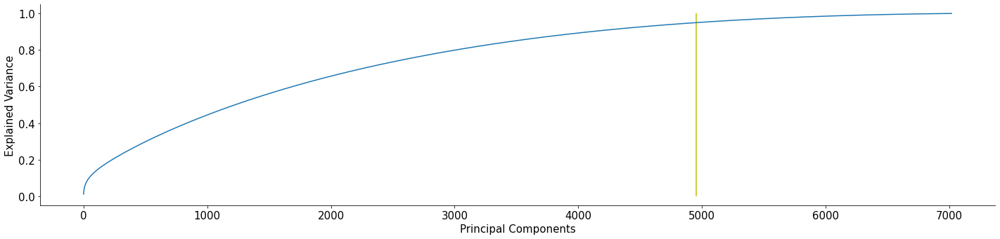

In [ ]:
# 2. Plot cumulative explained variance
rcParams['figure.figsize'] = [20, 5]

csum = np.cumsum(pca.explained_variance_ratio_)

threshold = 0.95
int_dim = np.where(csum >= threshold)[0][0] 
print(int_dim) 

'''
# thershold of cumulative explained_variance = 0.95:4954, 0.7:2264 -> quite noisy..? (too big for the # of hidden layer...?) / maybe some denoising process first.. -> typical technique for preprocessing two-photon data??
'''

plt.plot(csum)
plt.xlabel('Principal Components')
plt.ylabel('Explained Variance')
plt.vlines(np.where(csum>=0.95)[0][0],ymin=0,ymax=1, colors='y')
plt.show()

In [ ]:
# Effective dimensionality 

def get_effective_dimensionality (entropy, design_matrix):
  """
  Args

  design_matrix: n x p (data matrix)
  entropy : shannon (H1) / quadratic (H2)

  """

  # Step1. covariance matrix 
  
  covmat = np.cov(design_matrix) # n x n matrix 

  # Step2. Eigen_decomposition for the covariance matrix (to get 'spectrum')

  eigvals = np.linalg.eigvals(covmat)

  #Step3. Recast the spectrum as a discreted probability distribution 

  disprob = [eigval/np.sum(eigvals) for eigval in eigvals]

  # Step4. Calculate ED depending on the metric of entropy 

  if entropy == 'shannon':
    ent = []
    for i in range(len(disprob)):
      prob = disprob[i]
      entropy = prob**(-prob)
      ent.append(entropy)
      ED = np.prod(ent)
  elif entropy == 'quadratic':
    ED = (np.sum(eigvals))**2/ np.sum([(eigval)**2 for eigval in eigvals])

  return ED 

In [ ]:
ED_H1 = get_effective_dimensionality(entropy='shannon',design_matrix=dat['sresp']) # 1680
ED_H2 = get_effective_dimensionality(entropy='quadratic',design_matrix=dat['sresp']) # 327

Supervised PCA

In [ ]:
from scipy.stats import zscore
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression

Supervised PCA _ Ver1. reducing dimension to 3 after filtering the data 

(problem here: explained variances using 3PCs are different for each behavior)

In [ ]:
trans_x = np.zeros((dat['sresp'].shape[0],3,3)) # list to store coefficeint of neurons resulting from supervised PCA : # 11983(total_neurons) x 3 components x 3 behavior 


for j in range(3): # j : iterate over each behavior var
  
  x = dat['sresp'].T # 7018 x 11983(neu)
  y = [dat['run'], dat['pupilArea'], dat['beh_svd_time'][:,0]] # 7018 x 3 (running speed, pupilArea, behavior_1st_SVD)
  x_extra_dim = x[:, np.newaxis] # (7018 x 1 x 11983)

  threshold = 0.1 
  n_component = 3
  
  y = y[j]
  dropouts =[] # list to store index of dropped_neurons
  chosens = [] # list to store index of passed_neurons
  
  for i in range(0, x_extra_dim.shape[2]):
    x_one_feature = x_extra_dim[:,:,i]               # i : iterative over single neuron
    reg_model = LinearRegression()
    reg_model.fit(x_one_feature, y)                  # univariate regression (x:single neuron, y:behavior correlates) # univariate regression, thus don't need scaling in this step 
    if (all([abs(reg_model.coef_[0]) < threshold])): # append feature(neuron) having coefficient lower than threshold to dropout list 
      dropouts.append(i)                             # index for dropout_neuron
    else :
      chosens.append(i)                              # index for chosen_neuron

  if (len(dropouts) == x_extra_dim.shape[2]):
    raise ValueError('Try a smaller thershold')      # all features have coef less than the threshold 

  print('threshold=%.2f, n_component=%d, dropout_neu = %d, chosen_neu = %d' %(threshold, n_component, len(dropouts), 11983-len(dropouts)))

  chosen_x = np.delete(x, dropouts, axis=1)          # delete from x those features which had coef less than the threshold, and were in the dropout set
  chosen_x = zscore(chosen_x, axis=0)                # time(7018) x chosen_neu (normalized in col)
  chosen_x = np.nan_to_num(chosen_x)

  spca=PCA(n_components=n_component)
  x_transform = spca.fit_transform(chosen_x)        # time(7018)x3(PCs) (project chosen neurons to 3PCs) -> using input data for reg_model_chosen_x
  spca_coef = spca.components_.T                    # chosen neu x PCs

  for c, k in zip(chosens, range(len(chosens))):
    trans_x[c,:,j]= spca_coef[k]

  reg_model_chosen_x = LinearRegression()
  reg_model_chosen_x.fit(x_transform,y)
  print('threshold =%.2f, regression performance = %.2f' %(threshold, reg_model_chosen_x.score(x_transform,y))) # 0.59 on threshold 0.2 


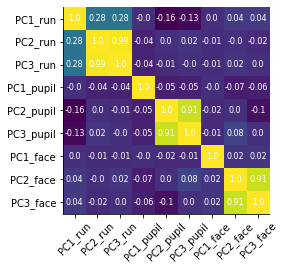

'\n# similarity of PC vectors within behavior : most apparent in running speed,\n# similarity of PC_vectors across behavior : relatively more similar btw pupil and face\n# It can be quite interesting in that similarity in neural representation matches with our intuition ..(?)\n'

In [ ]:
# Plot PCs_matrix using heatmap

from sklearn.metrics.pairwise import cosine_similarity
import seaborn as sns

PC_colvec = trans_x.reshape((11983,9))
PC_cossim = cosine_similarity(PC_colvec.T)

fig, ax = plt.subplots()
im = ax.imshow(PC_cossim)
ticklabels = ['PC1_run','PC2_run','PC3_run','PC1_pupil','PC2_pupil','PC3_pupil','PC1_face','PC2_face','PC3_face']

plt.xticks(np.arange(9), ticklabels, fontsize=10, rotation=45)
plt.yticks(np.arange(9), ticklabels, fontsize=10)

for i in range(PC_cossim.shape[0]):
    for j in range(PC_cossim.shape[1]):
        text = ax.text(j, i, round(PC_cossim[i,j],2),fontsize=8,
                       ha="center", va="center", color="w")
fig.tight_layout()      
plt.show()


Supervised_PCA_ver2. 
1) CV of the log-likeliood ratio statistic to informed choice for the threshold on univariate regression
2) Without reducing the dimension (just project filtered data to eigenvectors)


In [ ]:
# log-likelihood ratio statistic to estimate best value of threshold 

import statsmodels.api as sm

x = dat['sresp'].T  # 7018 x 11983(neu)
y = [dat['run'], dat['pupilArea'], dat['beh_svd_time'][:,0]]

ll_nulls = [] # loglikelihood for null hypothesis (entire neurons for each behavior)
for i in range(len(y)):
  model = sm.OLS(y[i],x)
  results = model.fit()
  ll_null = model.loglike(results.params)
  ll_nulls.append(l_null) # [71983.46578776847, 41112.799197052096, 38457.05209410115]

In [ ]:
import statsmodels.api as sm
from sklearn.model_selection import cross_val_score
import matplotlib.pyplot as plt
from sklearn.metrics import fbeta_score, make_scorer
from sklearn.model_selection import KFold
from statsmodels.regression.linear_model import OLSResults

thresholds = np.arange(0.05, 0.5, step=0.05)

for j in range (len(y)):
  beh = y[j]
  for threshold in thresholds:
    threshold = threshold 
    x_extra_dim = x[:, np.newaxis] # (7018 x 1 x 11983)    
    dropouts = [] # list to store index of dropped_neurons
    filtered = []  # list to store index of passed_neurons

    for i in range(0, x_extra_dim.shape[2]):
      x_one_feature = x_extra_dim[:,:,i]               # i : iterative over single neuron
      reg_model = LinearRegression()
      reg_model.fit(x_one_feature, beh)                  # univariate regression (x:single neuron, y:behavior correlates) # univariate regression, thus don't need scaling in this step 
      if (all([abs(reg_model.coef_[0]) < threshold])): # append feature(neuron) having coefficient lower than threshold to dropout list 
        dropouts.append(i)                             # index for dropout_neuron
      else :
        filtered.append(i)       

    filtered_x = np.delete(x, dropouts, axis=1)          # delete from x those features which had coef less than the threshold, and were in the dropout set
    filtered_x = zscore(filtered_x, axis=0)                # time(7018) x chosen_neu (normalized in col)
    filtered_x = np.nan_to_num(filtered_x)
 
    null_ols = sm.OLS(beh, x)
    null = null_ols.fit()
    res_ols = sm.OLS(beh, filtered_x) # restricted model 
    restricted = res_ols.fit()
    #result = ols.fit()
    #ll_model = ols.loglike(result.params)
    #ll_null = ll_nulls[j]
    
    lr_test = OLSResults.compare_lr_test(null, restricted)  # lr_test return : 1. lr_statfloat (likelihood ratio which is chisquare distributed with df_diff), 2. p_value, 3. df_diffint (difference in df between models)
    # print("threshold=%.2f, ll_stat=%.2f" %(threshold, ll_stat))
    print(lr_test)


'''
running speed
threshold = 0.05 (187164.63997123443, 0.0, 6400.0)
threshold = 0.1  (188700.00036051846, 0.0, 6842.0)
threshold = 0.15 (190197.99771910952, 0.0, 6953.0)
threshold = 0.2  (190814.45753387606, 0.0, 6988.0)
threshold = 0.25 (191436.0360446941, 0.0, 7003.0)
thresold = 0.3   (192696.37788158248, 0.0, 7012.0)
thrshold = 0.35  (192696.37788158248, 0.0, 7012.0)
threshold = 0.4 : all of neurons are filtered 
'''
'''
problem here is p-value of the statistic is zero at minimum threshold -> difficult to compare btw behaviors
'''


Supervised_PCA_ver3. 
1) Calculate r^2 of linear regression on the filtered data
2) without reducing the dimension, project to eigenvectors 


In [ ]:
# step1. Determine the optimal threshold for each behavior : to set regression model score identical on the filtered data 

from sklearn.model_selection import train_test_split

behav_var = ['running speed','pupil position','facial movement'] 
threshold_set = {'0','0.05','0.1','0.15','0.2','0.25','0.3'}
D = {b : dict.fromkeys(threshold_set) for b in behav_var}   

for j in range(3): # j : iterate over each behavior var

  bv = behav_var[j]
  print("behavior variable is  = %s" % bv)

  x = dat['sresp'].T # 7018 x 11983(neu)
  y = [dat['run'], dat['pupilArea'], dat['beh_svd_time'][:,0]] # 7018 x 3 (running speed, pupilArea, behavior_1st_SVD)
  x_extra_dim = x[:, np.newaxis] # (7018 x 1 x 11983)
  threshold_set = np.arange(0, 0.35, step = 0.05) 
  y = y[j]

  scores = []

  for t in threshold_set:
    print("threshold = %.2f" % t)
    dropouts =[] # list to store index of dropped_neurons
    chosens = [] # list to store index of passed_neurons
    for i in range(0, x_extra_dim.shape[2]):
      x_one_feature = x_extra_dim[:,:,i]               # i : iterative over single neuron
      reg_model = LinearRegression()
      reg_model.fit(x_one_feature, y)                  # univariate regression (x:single neuron, y:behavior correlates) # univariate regression, thus don't need scaling in this step 
      if (all([abs(reg_model.coef_[0]) < t])): # append feature(neuron) having coefficient lower than threshold to dropout list 
        dropouts.append(i)                             # index for dropout_neuron
      else :
        chosens.append(i)                              # index for chosen_neuron

    if (len(dropouts) == x_extra_dim.shape[2]):
      raise ValueError('Try a smaller thershold')      # all features have coef less than the threshold 

    print('threshold=%.2f, dropout_neu = %d, chosen_neu = %d' %(t, len(dropouts), 11983-len(dropouts)))

    chosen_x = np.delete(x, dropouts, axis=1)          # delete from x those features which had coef less than the threshold, and were in the dropout set
    chosen_x = zscore(chosen_x, axis=0)                # time(7018) x chosen_neu (normalized in col)
    chosen_x = np.nan_to_num(chosen_x)

    x_train, x_test, y_train, y_test = train_test_split(chosen_x, y, test_size = 0.33, random_state=1)
    reg_model_chosen_x = LinearRegression()
    reg_model_chosen_x.fit(x_train, y_train)  
    score = reg_model_chosen_x.score(x_test,y_test)  
    scores.append(score)
    print('score = %.2f' % score)
  
'''
behavior variable is  = running speed
threshold = 0.0
threshold=0.00, dropout_neu = 0, chosen_neu = 11983
score = 0.80
threshold = 0.1
threshold=0.05, dropout_neu = 11365, chosen_neu = 618
score = 0.79
threshold = 0.1
threshold=0.10, dropout_neu = 11807, chosen_neu = 176
score = 0.75
threshold = 0.2
threshold=0.15, dropout_neu = 11918, chosen_neu = 65
score = 0.66
threshold = 0.2
threshold=0.20, dropout_neu = 11953, chosen_neu = 30
score = 0.62
threshold = 0.2
threshold=0.25, dropout_neu = 11968, chosen_neu = 15
score = 0.57
threshold = 0.3
threshold=0.30, dropout_neu = 11977, chosen_neu = 6
score = 0.45
behavior variable is  = pupil position
threshold = 0.0
threshold=0.00, dropout_neu = 0, chosen_neu = 11983
score = 0.84
threshold = 0.1
threshold=0.05, dropout_neu = 901, chosen_neu = 11082
score = 0.83
threshold = 0.1
threshold=0.10, dropout_neu = 1818, chosen_neu = 10165
score = 0.82
threshold = 0.2
threshold=0.15, dropout_neu = 2739, chosen_neu = 9244
score = 0.80
threshold = 0.2
threshold=0.20, dropout_neu = 3614, chosen_neu = 8369
score = 0.77
threshold = 0.2
threshold=0.25, dropout_neu = 4487, chosen_neu = 7496
score = 0.72
threshold = 0.3
threshold=0.30, dropout_neu = 5244, chosen_neu = 6739
score = 0.64
behavior variable is  = facial movement
threshold = 0.0
threshold=0.00, dropout_neu = 0, chosen_neu = 11983
score = 0.88
threshold = 0.1
threshold=0.05, dropout_neu = 223, chosen_neu = 11760
score = 0.88
threshold = 0.1
threshold=0.10, dropout_neu = 408, chosen_neu = 11575
score = 0.88
threshold = 0.2
threshold=0.15, dropout_neu = 632, chosen_neu = 11351
score = 0.88
threshold = 0.2
threshold=0.20, dropout_neu = 846, chosen_neu = 11137
score = 0.87
threshold = 0.2
threshold=0.25, dropout_neu = 1070, chosen_neu = 10913
score = 0.87
threshold = 0.3
threshold=0.30, dropout_neu = 1264, chosen_neu = 10719
score = 0.87
'''

# problem here is r^score is dropped as we filtered neurons under the threshold..

In [ ]:
# step2. filtered data -> spectral decomposition (without reducing the dimension ) 

from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MinMaxScaler
import numpy as np

threshold = 0.2 # still arbitrary.. but keep going 

trans_x = np.zeros((dat['sresp'].shape[0], dat['sresp'].shape[1], 3)) # list to store filtered neural activity 
                                                                      # 11983(total_neurons) x time x 3 behavior 

spca_x = np.zeros((dat['sresp'].shape[1], min(dat['sresp'].shape[0], dat['sresp'].shape[1]), 3))  # list to store projected neural activity to the newly found axis obtained from supervised PCA 

for j in range(3): # j : iterate over each behavior var
  
  x = dat['sresp'].T                                              # 7018 x 11983(neu)
  scaler = MinMaxScaler(feature_range=(0,1))     
  x = scaler.fit_transform(x)                      # transform the range of the data to [0,1] : for the probablistic interpretation 
  y = [dat['run'], dat['pupilArea'], dat['beh_svd_time'][:,0]]    # 7018 x 3 (running speed, pupilArea, behavior_1st_SVD)
  x_extra_dim = x[:, np.newaxis]                                  # (7018 x 1 x 11983)
  
  y = y[j]
  dropouts =[] # list to store index of dropped_neurons
  chosens = [] # list to store index of passed_neurons
  
  for i in range(0, x_extra_dim.shape[2]):
    x_one_feature = x_extra_dim[:,:,i]               # i : iterative over single neuron
    reg_model = LinearRegression()
    reg_model.fit(x_one_feature, y)                  # univariate regression (x:single neuron, y:behavior correlates) # univariate regression, thus don't need scaling in this step 
    if (all([abs(reg_model.coef_[0]) < threshold])): # append feature(neuron) having coefficient lower than threshold to dropout list 
      dropouts.append(i)                             # index for dropout_neuron
    else :
      chosens.append(i)                              # index for chosen_neuron

  chosen_x = np.delete(x, dropouts, axis=1)          # delete from x those features which had coef less than the threshold, and were in the dropout set
  chosen_x = np.nan_to_num(chosen_x)                 
  chosen_x = chosen_x.T                              # n of chosen neu x 7018(time)
  for c, k in zip(chosens, range(len(chosens))):
    trans_x[c,:,j]= chosen_x[k]                          # 11983 (only chosen neurons have activity, and zero for filtered) x 7018(time)

  spca = PCA()                              # without reducing the dimension, just alignment 
  spca_x[:,:,j] = spca.fit_transform(trans_x[:,:,j].T)       # trans_x[:,:,j].T : time x neuron -> align nerual dimension -> time(7018) x eigenvectors(7018) 

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


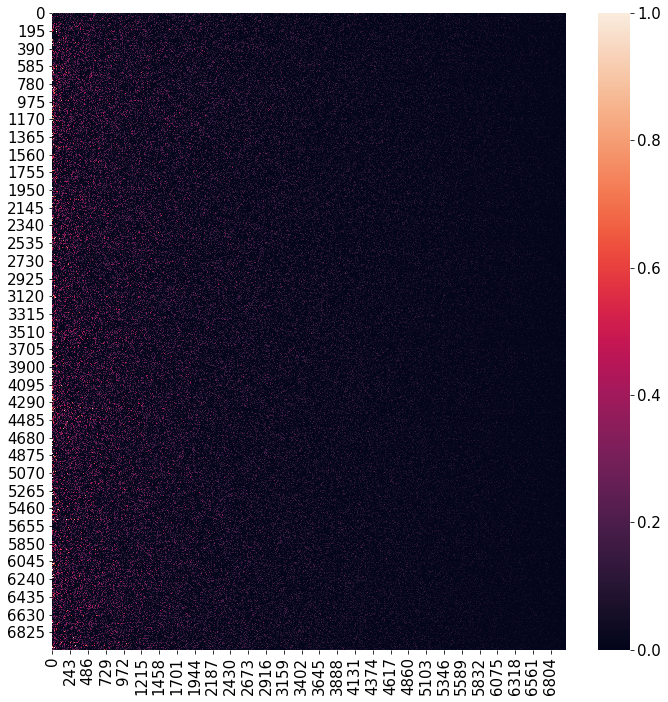

In [ ]:
# plot each eigenvectors obtained from supervised PCA for each behavior 

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize = (10,10))
sns.heatmap(spca_x[:,:,0], vmin=0, vmax=1) 
plt.show()

# row = timepoint, column = eigenvectors

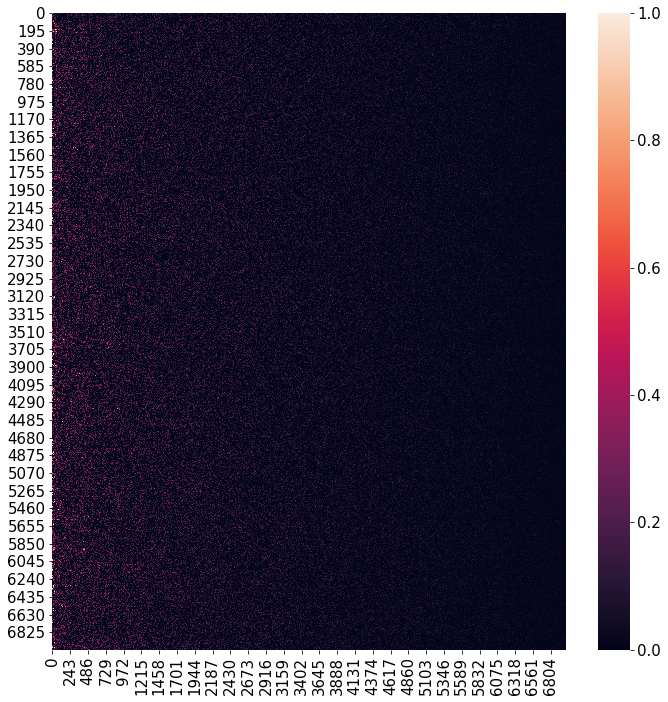

In [ ]:
plt.figure(figsize = (10,10))
sns.heatmap(spca_x[:,:,1], vmin=0, vmax=1)
plt.show() 

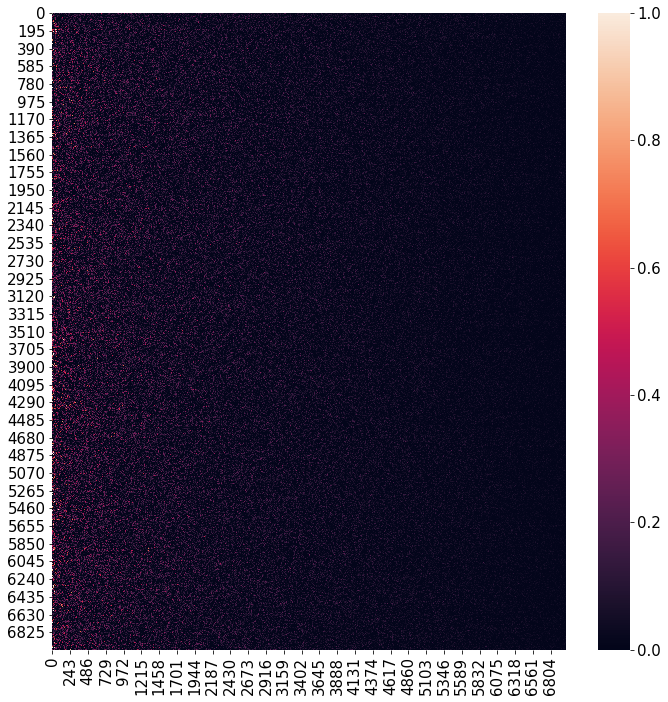

In [ ]:
plt.figure(figsize = (10,10))
sns.heatmap(spca_x[:,:,2],  vmin=0, vmax=1)
plt.show() 

Construct MLP (multilayer perceptron) 

In [ ]:
# pip install torch

In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import  TensorDataset, DataLoader
from sklearn.model_selection import train_test_split


# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyper-parameters 
input_size = 11983
hidden_size = 2254 # ID 
num_classes = 1
num_epochs = 5
batch_size = 100
learning_rate = 0.001


In [ ]:
class NeuralNet(nn.Module):
    def __init__(self, input_size, hidden_size, num_classes):
        super(NeuralNet, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size) 
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(hidden_size, num_classes)  
    
    def forward(self, x):
        out = self.fc1(x)
        out = self.relu(out)
        out = self.fc2(out)
        return out

In [ ]:

# Data

X = dat['sresp'].T   
y = dat['pupilArea'] # y = [dat['run'], dat['pupilArea'], dat['beh_svd_time'][:,0]]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)
X_train = torch.tensor(X_train, dtype=torch.float32)
y_train = torch.tensor(y_train, dtype=torch.float32)
X_test = torch.tensor(X_test, dtype=torch.float32)
y_test = torch.tensor(y_test, dtype=torch.float32)


train_dataset = TensorDataset(X_train, y_train)
test_dataset = TensorDataset(X_test, y_test)

# Data loader
train_loader = torch.utils.data.DataLoader(dataset=train_dataset, 
                                           batch_size=batch_size, 
                                           shuffle=True)

test_loader = torch.utils.data.DataLoader(dataset=test_dataset, 
                                          batch_size=batch_size, 
                                          shuffle=False)

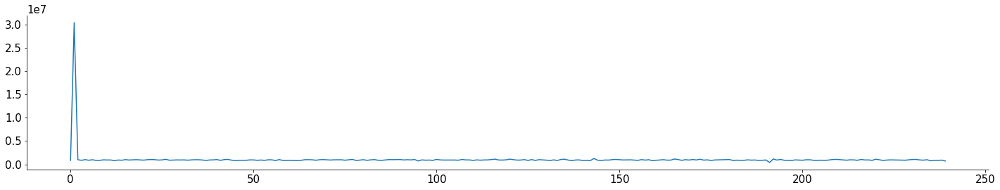

In [ ]:


# Model : MLP wt single hidden layer 
model = NeuralNet(input_size, hidden_size, num_classes).to(device)

# Loss and optimizer
criterion = torch.nn.MSELoss(size_average=None, reduce=None, reduction='mean')
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)  

# Train the model
total_step = len(train_loader)
loss_values = []
for epoch in range(num_epochs):
  running_loss = 0.0
  for i, (neurons, labels) in enumerate(train_loader):  
      # Move tensors to the configured device
      neurons = neurons.to(device) # iterate over batch 
      labels = labels.to(device)

      # Forward pass
      outputs = model(neurons)
      loss = criterion(outputs, labels)
      running_loss = loss.item()
      loss_values.append(running_loss)

      # Backward and optimize
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()
      if (i+1) % 100 == 0:
          print ('Epoch [{}/{}], Step [{}/{}], Loss: {:.4f}' 
                  .format(epoch+1, num_epochs, i+1, total_step, loss.item()))
plt.plot(loss_values)



In [ ]:
# Test the model using r2_score


from sklearn.metrics import r2_score

with torch.no_grad():
  correct = 0
  total = 0
  X_test = X_test.to(device)
  y_test = y_test.to(device)
  y_pred = model(X_test)

y_test_np = y_test.numpy()
y_pred_np = y_pred.numpy()
r2_score = r2_score(y_test_np, y_pred_np) # running speed: 0.75, pupil : , face:
print(r2_score)

In [ ]:
# Save the model checkpoint
from google.colab import files

torch.save(model.state_dict(), 'pupil_nn.pth')
files.download('pupil_nn.pth')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# load_model 
files.upload()
model_run = NeuralNet(input_size, hidden_size, num_classes)
model_run.load_state_dict(torch.load('run_nn.pth'))
model_run.eval()

Saving run_nn.pth to run_nn (1).pth


NeuralNet(
  (fc1): Linear(in_features=11983, out_features=2254, bias=True)
  (relu): ReLU()
  (fc2): Linear(in_features=2254, out_features=1, bias=True)
)

In [ ]:
files.upload()
model_pupil = NeuralNet(input_size, hidden_size, num_classes)
model_pupil.load_state_dict(torch.load('pupil_nn.pth'))
model_pupil.eval()

Saving pupil_nn (1).pth to pupil_nn (1) (1).pth


NeuralNet(
  (fc1): Linear(in_features=11983, out_features=2254, bias=True)
  (relu): ReLU()
  (fc2): Linear(in_features=2254, out_features=1, bias=True)
)

In [ ]:
files.upload()
model_face = NeuralNet(input_size, hidden_size, num_classes)
model_face.load_state_dict(torch.load('face_nn.pth'))
model_face.eval()

Saving face_nn.pth to face_nn (1).pth


NeuralNet(
  (fc1): Linear(in_features=11983, out_features=2254, bias=True)
  (relu): ReLU()
  (fc2): Linear(in_features=2254, out_features=1, bias=True)
)

In [ ]:
for param_tensor in model.state_dict():
    print(param_tensor, "\t", model.state_dict()[param_tensor].size())

fc1.weight 	 torch.Size([2254, 11983])
fc1.bias 	 torch.Size([2254])
fc2.weight 	 torch.Size([1, 2254])
fc2.bias 	 torch.Size([1])


In [ ]:
# weigt matrix btw input and hidden layer -> we can see how original neurons are combinated to construct neural mode (covariation pattern across neurons)

wm = model.state_dict()['fc1.weight'] 

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


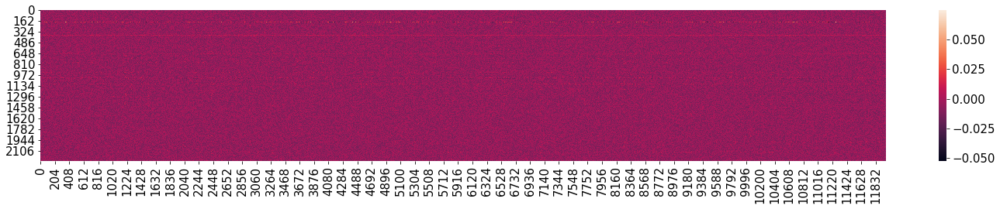

In [ ]:
# Plot the weight matrix for each behavior (plot here is for the running speed)

import seaborn as sns
sns.heatmap(wm.numpy())


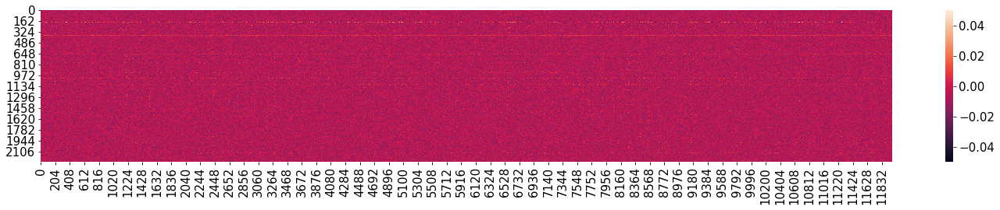

In [ ]:
sns.heatmap(wm.numpy(), vmin=-0.05, vmax=0.05) # constrain the min-max of the plot

In [ ]:
# maybe in next step : Comparison representation of hidden layer btw each behavior model 

import torch.nn.functional as F
fc1_outputs = model.fc1(X_test)
fc1_outputs = F.relu(fc1_outputs) # test_sample, # hidden node
fc1_outputs = fc1_outputs.detach().numpy()
rep_vect_pupil = np.mean(fc1_outputs, axis=0) # (1, hidden node) # representation vector for hidden layer (mean activation during X_test)




In [ ]:
# Plot rep_vect

from sklearn.metrics.pairwise import cosine_similarity
import seaborn as sns

rep_vectors = np.hstack((rep_vect_run, rep_vect_pupil, rep_vect_face))
rep_cossim = cosine_similarity(rep_vectors)

fig, ax = plt.subplots()
im = ax.imshow(rep_cossim)
ticklabels = ['rep_vect_run','rep_vect_pupil','rep_vect_face']
plt.xticks(np.arange(9), ticklabels, fontsize=10, rotation=45)
plt.yticks(np.arange(9), ticklabels, fontsize=10)

for i in range(rep_cossim.shape[0]):
    for j in range(rep_cossim.shape[1]):
        text = ax.text(j, i, round(rep_cossim[i,j],2),fontsize=8,
                       ha="center", va="center", color="w")
fig.tight_layout()      
plt.show()

Correlation distance between neuronal activity and behavioral features

In [ ]:
#Sort neuron based on correlation between activity and different behavioral features
sorted_idx = {
              'run':           [i[0] for i in sorted(enumerate(corr_vals['run'].T), key=lambda x:x[1])],
              'pupilArea':     [i[0] for i in sorted(enumerate(corr_vals['pupilArea'].T), key=lambda x:x[1])],
              'pupilCOM_x':    [i[0] for i in sorted(enumerate(corr_vals['pupilCOM'][0,:].T), key=lambda x:x[1])],
              'pupilCOM_y':    [i[0] for i in sorted(enumerate(corr_vals['pupilCOM'][1,:].T), key=lambda x:x[1])],
              'beh_svd_time':  [i[0] for i in sorted(enumerate(corr_vals['beh_svd_time'][0,:].T), key=lambda x:x[1])]
}

[Text(0, 0.5, 'sorted neurons'),
 Text(0.5, 0, 'timepoints'),
 Text(0.5, 1.0, 'Neuron sorted by cdist with ben_svd_time')]

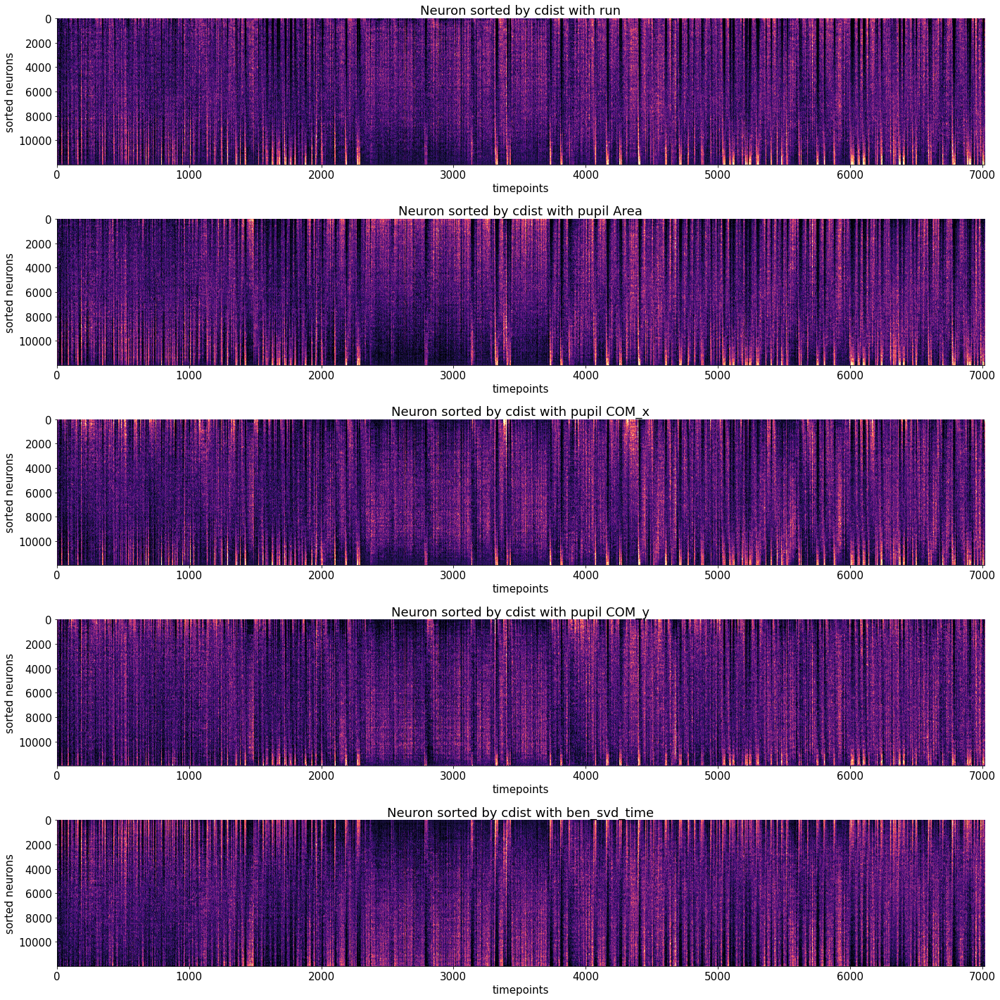

In [ ]:
#plot heatmap of neuronal activity sorted by cdist with run,pupilArea,pupilCOM,beh_svd_time
from scipy.ndimage import uniform_filter1d
Z = np.nan_to_num(Z)

rcParams['figure.figsize'] = [20, 20]
ax = plt.subplot(5,1,1)
RasterMap = uniform_filter1d(Z[sorted_idx['run'], :], size= 50, axis=0)
RasterMap = zscore(RasterMap[::1, :], axis = 1)
trange = np.arange(0, 7018)
plt.imshow(RasterMap[:, trange], vmax= 3, vmin = -1, aspect = 'auto', cmap = 'magma')
ax.set(xlabel = 'timepoints', ylabel = 'sorted neurons',title='Neuron sorted by cdist with run')

ax = plt.subplot(5,1,2)
RasterMap = uniform_filter1d(Z[sorted_idx['pupilArea'], :], size= 50, axis=0)
RasterMap = zscore(RasterMap[::1, :], axis = 1)
trange = np.arange(0, 7018)
plt.imshow(RasterMap[:, trange], vmax= 3, vmin = -1, aspect = 'auto', cmap = 'magma')
ax.set(xlabel = 'timepoints', ylabel = 'sorted neurons',title='Neuron sorted by cdist with pupil Area')

ax = plt.subplot(5,1,3)
RasterMap = uniform_filter1d(Z[sorted_idx['pupilCOM_x'], :], size= 50, axis=0)
RasterMap = zscore(RasterMap[::1, :], axis = 1)
trange = np.arange(0, 7018)
plt.imshow(RasterMap[:, trange], vmax= 3, vmin = -1, aspect = 'auto', cmap = 'magma')
ax.set(xlabel = 'timepoints', ylabel = 'sorted neurons',title='Neuron sorted by cdist with pupil COM_x')

ax = plt.subplot(5,1,4)
RasterMap = uniform_filter1d(Z[sorted_idx['pupilCOM_y'], :], size= 50, axis=0)
RasterMap = zscore(RasterMap[::1, :], axis = 1)
trange = np.arange(0, 7018)
plt.imshow(RasterMap[:, trange], vmax= 3, vmin = -1, aspect = 'auto', cmap = 'magma')
ax.set(xlabel = 'timepoints', ylabel = 'sorted neurons',title='Neuron sorted by cdist with pupil COM_y')

ax = plt.subplot(5,1,5)
RasterMap = uniform_filter1d(Z[sorted_idx['beh_svd_time'], :], size= 50, axis=0)
RasterMap = zscore(RasterMap[::1, :], axis = 1)
trange = np.arange(0, 7018)
plt.imshow(RasterMap[:, trange], vmax= 3, vmin = -1, aspect = 'auto', cmap = 'magma')
ax.set(xlabel = 'timepoints', ylabel = 'sorted neurons',title='Neuron sorted by cdist with ben_svd_time')


In [ ]:
# group the spatial 
x, y, z = dat['xyz'] # x,y,z spatial location of each neuron

Depth_info_sorted_by_cdist = {
    'run_pos':z[sorted_idx['run'][0:400]],
    'run_neg':z[sorted_idx['run'][-401:-1]],
    'pupilArea_pos':z[sorted_idx['pupilArea'][0:400]],
    'pupilArea_neg':z[sorted_idx['pupilArea'][-401:-1]],
    'pupilCOM_x_pos':z[sorted_idx['pupilCOM_x'][0:400]],
    'pupilCOM_x_neg':z[sorted_idx['pupilCOM_x'][-401:-1]],
    'pupilCOM_y_pos':z[sorted_idx['pupilCOM_y'][0:400]],
    'pupilCOM_y_neg':z[sorted_idx['pupilCOM_y'][-401:-1]],
    'beh_svd_time_pos':z[sorted_idx['beh_svd_time'][0:400]],
    'beh_svd_time_neg':z[sorted_idx['beh_svd_time'][-401:-1]]
}

[Text(0, 0.5, 'Neuron count'),
 Text(0.5, 0, 'Depth(um)'),
 Text(0.5, 1.0, 'beh_svd_time_neg')]

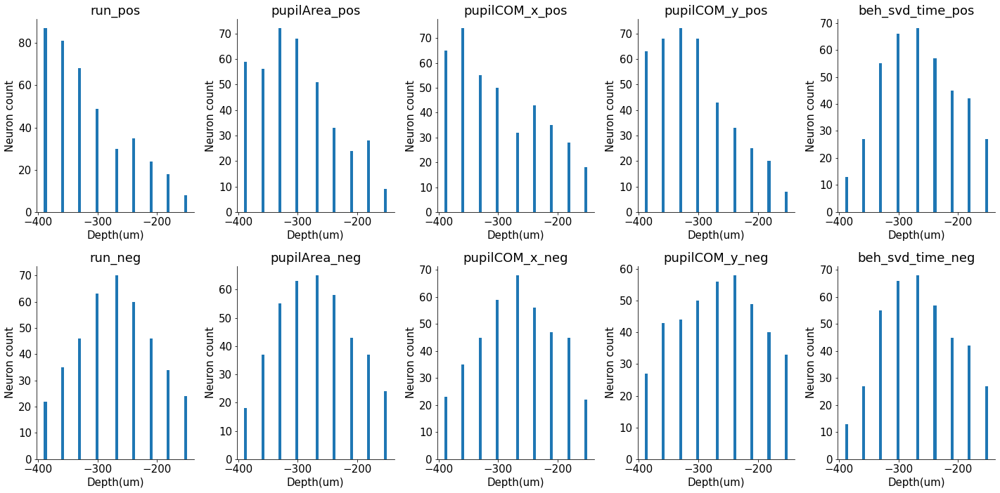

In [ ]:
#find depth of positive/negative correlated group with different behavioral features
rcParams['figure.figsize'] = [20, 10]
ax = plt.subplot(2,5,1)
plt.hist(Depth_info_sorted_by_cdist['run_pos'], bins=50)
ax.set(xlabel = 'Depth(um)', ylabel = 'Neuron count',title = 'run_pos')
ax = plt.subplot(2,5,6)
plt.hist(Depth_info_sorted_by_cdist['run_neg'], bins=50)
ax.set(xlabel = 'Depth(um)', ylabel = 'Neuron count',title = 'run_neg')
ax = plt.subplot(2,5,2)
plt.hist(Depth_info_sorted_by_cdist['pupilArea_pos'], bins=50)
ax.set(xlabel = 'Depth(um)', ylabel = 'Neuron count',title = 'pupilArea_pos')
ax = plt.subplot(2,5,7)
plt.hist(Depth_info_sorted_by_cdist['pupilArea_neg'], bins=50)
ax.set(xlabel = 'Depth(um)', ylabel = 'Neuron count',title = 'pupilArea_neg')
ax = plt.subplot(2,5,3)
plt.hist(Depth_info_sorted_by_cdist['pupilCOM_x_pos'], bins=50)
ax.set(xlabel = 'Depth(um)', ylabel = 'Neuron count',title = 'pupilCOM_x_pos')
ax = plt.subplot(2,5,8)
plt.hist(Depth_info_sorted_by_cdist['pupilCOM_x_neg'], bins=50)
ax.set(xlabel = 'Depth(um)', ylabel = 'Neuron count',title = 'pupilCOM_x_neg')
ax = plt.subplot(2,5,4)
plt.hist(Depth_info_sorted_by_cdist['pupilCOM_y_pos'], bins=50)
ax.set(xlabel = 'Depth(um)', ylabel = 'Neuron count',title = 'pupilCOM_y_pos')
ax = plt.subplot(2,5,9)
plt.hist(Depth_info_sorted_by_cdist['pupilCOM_y_neg'], bins=50)
ax.set(xlabel = 'Depth(um)', ylabel = 'Neuron count',title = 'pupilCOM_y_neg')
ax = plt.subplot(2,5,5)
plt.hist(Depth_info_sorted_by_cdist['beh_svd_time_pos'], bins=50)
ax.set(xlabel = 'Depth(um)', ylabel = 'Neuron count',title = 'beh_svd_time_pos')
ax = plt.subplot(2,5,10)
plt.hist(Depth_info_sorted_by_cdist['beh_svd_time_pos'], bins=50)
ax.set(xlabel = 'Depth(um)', ylabel = 'Neuron count',title = 'beh_svd_time_neg')

In [ ]:
def list_match_ratio(a,b):  #calcualte the ratio that elements in b exist in a   ratio = (b in a)/a (Overlapped ratio of a&b)
  c=[]
  for i in a:
    if i in b:
      c.append(i)
  return len(c)/len(a)

def match_idx_by_groups(sorted_idx_list_1,sorted_idx_list_2):
  # each group have the equal number of neurons, just the sorted order is different (based on the cdist)
  # the default is aribitually seperate each list into 30 groups
  match_ratio = np.zeros(30)
  for group_idx, group_start in enumerate(range(0,11983,400)): 
    if group_idx < 29:
      match_ratio[group_idx] = list_match_ratio(sorted_idx_list_1[group_start:group_start+399],sorted_idx_list_2[group_start:group_start+399])
    if group_idx == 29:
      match_ratio[group_idx] = list_match_ratio(sorted_idx_list_1[group_start:11982],sorted_idx_list_2[group_start:11982])
  return match_ratio


In [ ]:
#Sort neuron based on correlation between activity and different behavioral features
sorted_idx = {
              'run':           [i[0] for i in sorted(enumerate(corr_vals['run'].T), key=lambda x:x[1])],
              'pupilArea':     [i[0] for i in sorted(enumerate(corr_vals['pupilArea'].T), key=lambda x:x[1])],
              'pupilCOM_x':    [i[0] for i in sorted(enumerate(corr_vals['pupilCOM'][0,:].T), key=lambda x:x[1])],
              'pupilCOM_y':    [i[0] for i in sorted(enumerate(corr_vals['pupilCOM'][1,:].T), key=lambda x:x[1])],
              'beh_svd_time':  [i[0] for i in sorted(enumerate(corr_vals['beh_svd_time'][0,:].T), key=lambda x:x[1])]
}

In [ ]:
# seperate the neurons into 30 groups based on the cdist
list_match_ratio = {
    'run_pupilArea': match_idx_by_groups(sorted_idx['run'],sorted_idx['pupilArea']),
    'run_pupilCOM_x': match_idx_by_groups(sorted_idx['run'],sorted_idx['pupilCOM_x']),
    'run_pipilCOM_y': match_idx_by_groups(sorted_idx['run'],sorted_idx['pupilCOM_y']),
    'run_beh_svd_time': match_idx_by_groups(sorted_idx['run'],sorted_idx['beh_svd_time']),
    'pupilArea_pupilCOM_x': match_idx_by_groups(sorted_idx['pupilArea'],sorted_idx['pupilCOM_x']),
    'pupilArea_pupilCOM_y': match_idx_by_groups(sorted_idx['pupilArea'],sorted_idx['pupilCOM_y']),
    'pupilArea_beh_svd_time': match_idx_by_groups(sorted_idx['pupilArea'],sorted_idx['beh_svd_time']),
    'pupilCOM_x_pupilCOM_y': match_idx_by_groups(sorted_idx['pupilCOM_x'],sorted_idx['pupilCOM_y']),
    'pupilCOM_x_beh_svd_time': match_idx_by_groups(sorted_idx['pupilCOM_x'],sorted_idx['beh_svd_time']),
    'pipilCOM_y_beh_svd_time': match_idx_by_groups(sorted_idx['pupilCOM_y'],sorted_idx['beh_svd_time'])
}


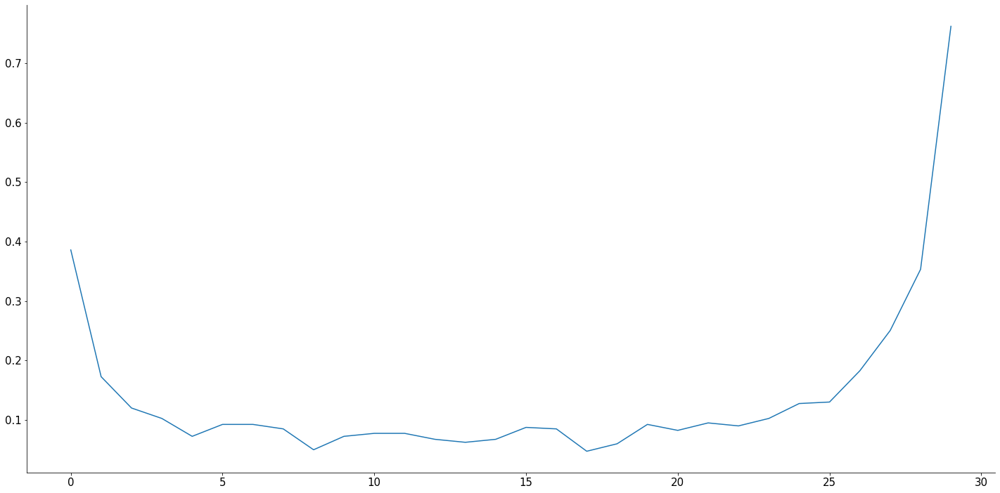

In [ ]:
plt.plot(list_match_ratio['run_pupilArea'],label = 'run_pupilArea')

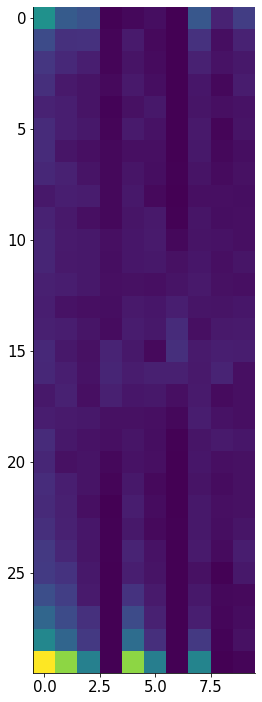

In [ ]:
#plot heatmap of overlapped ratio between different behavioral features
match_heatmap = np.zeros((30,10))
for i,j in enumerate(list_match_ratio.keys()):
  match_heatmap[:,i] = list_match_ratio[j]


plt.imshow(match_heatmap)